# Legal Studies 123 Final Project: #

## Predicting New York City Crime Rates with Factors of Gentrification ##

### Project Members: Abdul Choudhry, Sammy Chean-Udell, Christian Gutierrez, Louisa Ng ###
### Group 10, Spring 2022 ###

In [78]:
# standard imports
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import geopandas as gpd
import folium
import json
import random
from random import sample
from folium.plugins import HeatMap, HeatMapWithTime
import geojson
import datetime
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Ridge, Lasso, LinearRegression
from sklearn.linear_model import RidgeCV, LassoCV
from sklearn.model_selection import KFold
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import r2_score
from sklearn.feature_selection import RFE
from sklearn.svm import SVR
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import SGDRegressor

**As gentrification continues to impact marginalized communities of color across the nation, individuals from low socioeconomic backgrounds are displaced. Our project focuses on the relationship between gentrification, specifically eviction, and crime rates across the five boroughs of New York. Our research shows that an inverse correlation between evictions and crime rates exists, meaning that as the number of evictions increases, the number of crimes decreases. While on the surface a decrease in crime seems a net positive, in actuality, it leads to the centralization of crime in neighborhoods in which affected individuals are pushed. The centralization of crime brings an increase in racially biased policing practices, such as the use of risk assessment tools, which further perpetuates cycles of impoverishment in these communities. While crime rates may, in theory, decrease in the developing communities because of gentrification, crime rates are increasing in outskirt neighborhoods because of the influx of displaced individuals and police officers.**

**Our visualizations show that both Brooklyn and the Bronx have the highest number of evictions and a significantly low number of crimes. According to Schelling’s “Dynamic Models of Segregation”, this is most likely due to a phenomenon known as the “racial tipping point”, a concept where an area's non-white population will eventually reach a certain threshold such that white “flight” exists (Schelling 1971). So,  as non-white resident leave the gentrified areas, a “poverty threshold” is reached, decreasing crime rates in these immediate communities.**

**Using data obtained from public-use sources made available by the State of New York, we delve into the relationship between evictions and crime rates in the state. Our datasets primarily come from the city of New York’s open access domain, which hosts myriad datasets across various industries. We use eviction as a marker for gentrification because it signifies the beginning of the gentrification process. Through exploratory data analysis and predictive modeling techniques such as Decision Tree Regression, we prove the existence of the inverse relationship between crime and eviction rates. After exploring OLS, Ridge, Lasso, SVR, and Decision Tree Regression methods, the Decision Tree model had the lowest RMSE score and highest R^2 score, signifying its success in predicting crime rates.** 

# Part 1: Exploratory Data Analysis (EDA) #

In [79]:
# sampling 100,000 rows of the large NYPD arrests dataset for efficiency
arrests = pd.read_csv("NYPD_arrests_sampled100000.csv").drop(columns = ["Unnamed: 0"])
arrests

,ARREST_KEY,ARREST_DATE,PD_CD,PD_DESC,KY_CD,OFNS_DESC,LAW_CODE,LAW_CAT_CD,ARREST_BORO,ARREST_PRECINCT,JURISDICTION_CODE,AGE_GROUP,PERP_SEX,PERP_RACE,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,Lon_Lat
0,74040476,08/07/2010,905.0,"INTOXICATED DRIVING,ALCOHOL",347.0,INTOXICATED & IMPAIRED DRIVING,VTL11920M3,M,Q,110,0.0,18-24,M,BLACK HISPANIC,1019164.0,210169.0,40.743481,-73.874004,POINT (-73.87400353699996 40.743481264000025)
1,73484776,07/01/2010,478.0,"THEFT OF SERVICES, UNCLASSIFIED",343.0,OTHER OFFENSES RELATED TO THEFT,PL 1651503,M,B,52,1.0,<18,M,BLACK,1014295.0,253237.0,40.861709,-73.891382,POINT (-73.89138208599996 40.86170890900007)
2,90801077,05/24/2013,101.0,ASSAULT 3,344.0,ASSAULT 3 & RELATED OFFENSES,PL 1200001,M,K,77,0.0,25-44,F,BLACK,1005328.0,183150.0,40.669364,-73.924020,POINT (-73.92401953899997 40.669364302000076)
3,90565435,05/10/2013,782.0,"WEAPONS, POSSESSION, ETC",236.0,DANGEROUS WEAPONS,PL 2650101,M,S,123,0.0,18-24,M,WHITE,930862.0,133331.0,40.532486,-74.192060,POINT (-74.19206031 40.53248569700002)
4,23364940,07/13/2006,109.0,"ASSAULT 2,1,UNCLASSIFIED",106.0,FELONY ASSAULT,PL 1201001,F,K,81,0.0,18-24,M,BLACK,1005312.0,190540.0,40.689648,-73.924054,POINT (-73.92405412199997 40.68964821100008)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,10554275,03/03/2006,849.0,"NY STATE LAWS,UNCLASSIFIED VIOLATION",677.0,OTHER STATE LAWS,LOC000000V,V,K,62,1.0,<18,F,WHITE,988289.0,161509.0,40.609989,-73.985455,POINT (-73.98545461799995 40.60998854600007)
99996,139566715,11/08/2014,922.0,"TRAFFIC,UNCLASSIFIED MISDEMEAN",348.0,VEHICLE AND TRAFFIC LAWS,VTL0511001,M,B,52,0.0,25-44,M,BLACK,1008368.0,253290.0,40.861873,-73.912809,POINT (-73.91280930499997 40.86187255900006)
99997,190943683,12/09/2018,106.0,"ASSAULT 2,1,PEACE OFFICER",106.0,FELONY ASSAULT,PL 1201100,F,M,32,0.0,18-24,M,BLACK HISPANIC,1000970.0,239324.0,40.823557,-73.939590,POINT (-73.93958959499997 40.82355708600005)
99998,69421414,12/31/2009,339.0,"LARCENY,PETIT FROM OPEN AREAS,UNCLASSIFIED",341.0,PETIT LARCENY,PL 1552500,M,Q,112,0.0,45-64,M,WHITE,1025712.0,198128.0,40.710403,-73.850447,POINT (-73.85044729299993 40.710403418000055)


**In order to perform our initial exloratory data analysis, we sampled 100,000 rows of the larger New York City arrest dataset, which had about one million rows of data.**

In [80]:
#seeing how many arrests occurred in each year
arrests["year"] = arrests["ARREST_DATE"].str.extract("\d{2}\/\d{2}\/(\d{4})")
arrests["year"].value_counts()

2010    8266
2009    8225
2011    7944
2007    7939
2008    7839
2013    7608
2012    7549
2014    7482
2006    7249
2015    6629
2016    6084
2017    5483
2018    4808
2019    4209
2020    2686
Name: year, dtype: int64

In [81]:
#looking to see which columns have null values in order to remove them
arrests.isnull().sum()

ARREST_KEY             0
ARREST_DATE            0
PD_CD                  6
PD_DESC              169
KY_CD                169
OFNS_DESC            169
LAW_CODE               4
LAW_CAT_CD           323
ARREST_BORO            0
ARREST_PRECINCT        0
JURISDICTION_CODE      0
AGE_GROUP              0
PERP_SEX               0
PERP_RACE              0
X_COORD_CD             0
Y_COORD_CD             0
Latitude               0
Longitude              0
Lon_Lat                0
year                   0
dtype: int64

In [82]:
null_columns = ["PD_CD", "PD_DESC", "KY_CD", "OFNS_DESC", "LAW_CODE", "LAW_CAT_CD", "X_COORD_CD", 
               "Y_COORD_CD", "Latitude", "Longitude", "Lon_Lat", "Point"]
arrests = arrests.dropna()

arrests

,ARREST_KEY,ARREST_DATE,PD_CD,PD_DESC,KY_CD,OFNS_DESC,LAW_CODE,LAW_CAT_CD,ARREST_BORO,ARREST_PRECINCT,JURISDICTION_CODE,AGE_GROUP,PERP_SEX,PERP_RACE,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,Lon_Lat,year
0,74040476,08/07/2010,905.0,"INTOXICATED DRIVING,ALCOHOL",347.0,INTOXICATED & IMPAIRED DRIVING,VTL11920M3,M,Q,110,0.0,18-24,M,BLACK HISPANIC,1019164.0,210169.0,40.743481,-73.874004,POINT (-73.87400353699996 40.743481264000025),2010
1,73484776,07/01/2010,478.0,"THEFT OF SERVICES, UNCLASSIFIED",343.0,OTHER OFFENSES RELATED TO THEFT,PL 1651503,M,B,52,1.0,<18,M,BLACK,1014295.0,253237.0,40.861709,-73.891382,POINT (-73.89138208599996 40.86170890900007),2010
2,90801077,05/24/2013,101.0,ASSAULT 3,344.0,ASSAULT 3 & RELATED OFFENSES,PL 1200001,M,K,77,0.0,25-44,F,BLACK,1005328.0,183150.0,40.669364,-73.924020,POINT (-73.92401953899997 40.669364302000076),2013
3,90565435,05/10/2013,782.0,"WEAPONS, POSSESSION, ETC",236.0,DANGEROUS WEAPONS,PL 2650101,M,S,123,0.0,18-24,M,WHITE,930862.0,133331.0,40.532486,-74.192060,POINT (-74.19206031 40.53248569700002),2013
4,23364940,07/13/2006,109.0,"ASSAULT 2,1,UNCLASSIFIED",106.0,FELONY ASSAULT,PL 1201001,F,K,81,0.0,18-24,M,BLACK,1005312.0,190540.0,40.689648,-73.924054,POINT (-73.92405412199997 40.68964821100008),2006
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,10554275,03/03/2006,849.0,"NY STATE LAWS,UNCLASSIFIED VIOLATION",677.0,OTHER STATE LAWS,LOC000000V,V,K,62,1.0,<18,F,WHITE,988289.0,161509.0,40.609989,-73.985455,POINT (-73.98545461799995 40.60998854600007),2006
99996,139566715,11/08/2014,922.0,"TRAFFIC,UNCLASSIFIED MISDEMEAN",348.0,VEHICLE AND TRAFFIC LAWS,VTL0511001,M,B,52,0.0,25-44,M,BLACK,1008368.0,253290.0,40.861873,-73.912809,POINT (-73.91280930499997 40.86187255900006),2014
99997,190943683,12/09/2018,106.0,"ASSAULT 2,1,PEACE OFFICER",106.0,FELONY ASSAULT,PL 1201100,F,M,32,0.0,18-24,M,BLACK HISPANIC,1000970.0,239324.0,40.823557,-73.939590,POINT (-73.93958959499997 40.82355708600005),2018
99998,69421414,12/31/2009,339.0,"LARCENY,PETIT FROM OPEN AREAS,UNCLASSIFIED",341.0,PETIT LARCENY,PL 1552500,M,Q,112,0.0,45-64,M,WHITE,1025712.0,198128.0,40.710403,-73.850447,POINT (-73.85044729299993 40.710403418000055),2009


In [83]:
arrests.isnull().sum()

ARREST_KEY           0
ARREST_DATE          0
PD_CD                0
PD_DESC              0
KY_CD                0
OFNS_DESC            0
LAW_CODE             0
LAW_CAT_CD           0
ARREST_BORO          0
ARREST_PRECINCT      0
JURISDICTION_CODE    0
AGE_GROUP            0
PERP_SEX             0
PERP_RACE            0
X_COORD_CD           0
Y_COORD_CD           0
Latitude             0
Longitude            0
Lon_Lat              0
year                 0
dtype: int64

In [84]:
sum(arrests["Lon_Lat"].isna())

0

**The code below creates an outline of nyc neighborhoods using different data (this data has neighborhood names within the geojson file, which will allow us to create point objects from strings).**


In [85]:
# Lon_Lat column contains string type objects, but we want a POINT geometry object 
type(arrests["Lon_Lat"].iloc[0])

str

In [86]:
# converts Lon_lat column from str to POINT objects
arrests["Point"] = gpd.GeoSeries.from_wkt(arrests["Lon_Lat"]) 
arrests = gpd.GeoDataFrame(arrests, geometry="Point", crs={"init": "epsg:4326"})
arrests.head(1)

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/Applications/anaconda3/lib/python3.7/site-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


,ARREST_KEY,ARREST_DATE,PD_CD,PD_DESC,KY_CD,OFNS_DESC,LAW_CODE,LAW_CAT_CD,ARREST_BORO,ARREST_PRECINCT,JURISDICTION_CODE,AGE_GROUP,PERP_SEX,PERP_RACE,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,Lon_Lat,year,Point
0,74040476,08/07/2010,905.0,"INTOXICATED DRIVING,ALCOHOL",347.0,INTOXICATED & IMPAIRED DRIVING,VTL11920M3,M,Q,110,0.0,18-24,M,BLACK HISPANIC,1019164.0,210169.0,40.743481,-73.874004,POINT (-73.87400353699996 40.743481264000025),2010,POINT (-73.87400 40.74348)


In [87]:
# Convert text file to JSON 
with open('nyc_neighborhood_outlines2_raw.txt') as json_file:     # name of the text file
    data2 = json.load(json_file)

# Convert JSON to GeoJson 
from geojson import dump
with open('nyc_neighborhood_outlines2.geojson', mode='w') as f:   # name of the output geojson file
   dump(data2, f)

nyc_neigh_outlines_json2 = json.load(open("nyc_neighborhood_outlines2_raw.txt"))

nyc_coords = [40.6955, -73.9509]
m2 = folium.Map(nyc_coords, zoom_start=11)

folium.GeoJson(nyc_neigh_outlines_json2, style_function=lambda feature: {
    'fillColor': '#ffff00',
    'fillOpacity': 0,
    'color': 'black',        
    'weight': 1
    }).add_to(m2)

m2

**The code below uses the same geoJSON data as above, converting it into a table. We can extract the different names of the neighborhoods from the table below, since we can't do it directly from the map.**

In [88]:
outlines_df = gpd.read_file("nyc_neighborhood_outlines2_raw.txt")
outlines_df = outlines_df[["neighborhood", "geometry"]]
outlines_df.head(3)

,neighborhood,geometry
0,Allerton,"POLYGON ((-73.84860 40.87167, -73.84582 40.870..."
1,Alley Pond Park,"POLYGON ((-73.74333 40.73888, -73.74371 40.739..."
2,Arden Heights,"POLYGON ((-74.16983 40.56108, -74.16982 40.561..."


**We are using a spatial join to merge our arrests datasets with the geojson data. We now have an arrests table with both a POINT and the neighborhood that the point falls under.**

In [89]:
if "neighborhood" not in list(arrests.columns):
    arrests = arrests.sjoin(outlines_df, how="inner")
arrests

/Applications/anaconda3/lib/python3.7/site-packages/geopandas/geodataframe.py:1938: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: +init=epsg:4326 +type=crs
Right CRS: EPSG:4326

  return geopandas.sjoin(left_df=self, right_df=df, *args, **kwargs)


,ARREST_KEY,ARREST_DATE,PD_CD,PD_DESC,KY_CD,OFNS_DESC,LAW_CODE,LAW_CAT_CD,ARREST_BORO,ARREST_PRECINCT,JURISDICTION_CODE,AGE_GROUP,PERP_SEX,PERP_RACE,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,Lon_Lat,year,Point,index_right,neighborhood
0,74040476,08/07/2010,905.0,"INTOXICATED DRIVING,ALCOHOL",347.0,INTOXICATED & IMPAIRED DRIVING,VTL11920M3,M,Q,110,0.0,18-24,M,BLACK HISPANIC,1019164.0,210169.0,40.743481,-73.874004,POINT (-73.87400353699996 40.743481264000025),2010,POINT (-73.87400 40.74348),91,Elmhurst
167,49297232,07/29/2008,397.0,"ROBBERY,UNCLASSIFIED,OPEN AREAS",105.0,ROBBERY,PL 1601001,F,Q,110,0.0,<18,M,WHITE HISPANIC,1019165.0,210453.0,40.744261,-73.873998,POINT (-73.87399845399995 40.74426076900005),2008,POINT (-73.87400 40.74426),91,Elmhurst
297,205851255,12/01/2019,101.0,ASSAULT 3,344.0,ASSAULT 3 & RELATED OFFENSES,PL 1200001,M,Q,110,0.0,45-64,M,WHITE HISPANIC,1019165.0,210166.0,40.743473,-73.874000,POINT (-73.87399994399993 40.74347302600006),2019,POINT (-73.87400 40.74347),91,Elmhurst
364,50686821,08/31/2008,849.0,"NY STATE LAWS,UNCLASSIFIED VIOLATION",677.0,OTHER STATE LAWS,LOC000000V,V,Q,110,1.0,18-24,M,BLACK,1020148.0,206460.0,40.733297,-73.870472,POINT (-73.87047226699997 40.73329704700007),2008,POINT (-73.87047 40.73330),91,Elmhurst
386,190198286,11/20/2018,105.0,STRANGULATION 1ST,106.0,FELONY ASSAULT,PL 1211200,F,Q,110,0.0,18-24,M,WHITE HISPANIC,1020237.0,210724.0,40.745000,-73.870128,POINT (-73.87012832399995 40.74500029700005),2018,POINT (-73.87013 40.74500),91,Elmhurst
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91753,23874237,08/15/2006,490.0,"STOLEN PROPERTY 3,POSSESSION",232.0,POSSESSION OF STOLEN PROPERTY 5,PL 1654000,M,S,122,0.0,<18,M,BLACK HISPANIC,948540.0,146332.0,40.568260,-74.128534,POINT (-74.12853392399995 40.568259711000046),2006,POINT (-74.12853 40.56826),250,Richmondtown
98257,37323246,12/28/2007,258.0,"CRIMINAL MISCHIEF 4TH, GRAFFITI",351.0,CRIMINAL MISCHIEF & RELATED OFFENSES,PL 1456002,M,S,122,0.0,<18,M,WHITE,947529.0,147162.0,40.570534,-74.132177,POINT (-74.13217735999996 40.570533768000075),2007,POINT (-74.13218 40.57053),250,Richmondtown
86297,142419691,04/25/2015,905.0,"INTOXICATED DRIVING,ALCOHOL",347.0,INTOXICATED & IMPAIRED DRIVING,VTL11920U2,M,K,66,0.0,18-24,M,ASIAN / PACIFIC ISLANDER,987483.0,174108.0,40.644570,-73.988351,POINT (-73.98835146699997 40.644570489000046),2015,POINT (-73.98835 40.64457),124,Green-Wood Cemetery
95082,86514762,08/30/2012,729.0,"FORGERY,ETC.,UNCLASSIFIED-FELONY",113.0,FORGERY,PL 1702500,F,K,72,0.0,25-44,M,WHITE HISPANIC,989492.0,176669.0,40.651599,-73.981110,POINT (-73.98111013299997 40.651598920000026),2012,POINT (-73.98111 40.65160),124,Green-Wood Cemetery


In [90]:
arrests_columns = list(arrests.columns)
arrests_columns

['ARREST_KEY',
 'ARREST_DATE',
 'PD_CD',
 'PD_DESC',
 'KY_CD',
 'OFNS_DESC',
 'LAW_CODE',
 'LAW_CAT_CD',
 'ARREST_BORO',
 'ARREST_PRECINCT',
 'JURISDICTION_CODE',
 'AGE_GROUP',
 'PERP_SEX',
 'PERP_RACE',
 'X_COORD_CD',
 'Y_COORD_CD',
 'Latitude',
 'Longitude',
 'Lon_Lat',
 'year',
 'Point',
 'index_right',
 'neighborhood']

In [91]:
#checking how many times each neighborhood appears in the dataset
arrests.groupby("neighborhood")["Point"].count()

neighborhood
Allerton           338
Alley Pond Park      4
Arden Heights       43
Arrochar            75
Arverne            196
                  ... 
Windsor Terrace     32
Woodhaven          178
Woodlawn            29
Woodrow             37
Woodside           277
Name: Point, Length: 252, dtype: int64

**Loading in the New York City evictions dataset. This dataset houses the features that help us determine how gentrified a neighborhood in New York is. We aim to analyze the relationship between crime (aka the arrests data that we took a sample of) and evictions in New York City, as the number of evictions in a neighborhood reveals how gentrified the area is.**

In [92]:
NY_evictions = pd.read_csv("Evictions.csv")
NY_evictions

,Court Index Number,Docket Number,Eviction Address,Eviction Apartment Number,Executed Date,Marshal First Name,Marshal Last Name,Residential/Commercial,BOROUGH,Eviction Postcode,Ejectment,Eviction/Legal Possession,Latitude,Longitude,Community Board,Council District,Census Tract,BIN,BBL,NTA
0,50187/19,94275,329 LINCOLN ROAD,4C,08/16/2019,Justin,Grossman,Residential,BROOKLYN,11225,Not an Ejectment,Possession,40.661502,-73.951910,9.0,40.0,800.0,3035375.0,3.013290e+09,Prospect Lefferts Gardens-Wingate
1,52464/18,77372,47 MCKEEVER PLACE,3-G,04/16/2018,Justin,Grossman,Residential,BROOKLYN,11225,Not an Ejectment,Possession,40.664977,-73.959031,9.0,35.0,325.0,3388698.0,3.013020e+09,Crown Heights South
2,K83145/16,78400,195 MENAHAN STREET,3-R,10/17/2017,Ileana,Rivera,Residential,BROOKLYN,11237,Not an Ejectment,Possession,40.697203,-73.918022,4.0,37.0,433.0,3075674.0,3.033070e+09,Bushwick North
3,21375/17,293203,647 CAULDWELL AVE,44,06/27/2017,George,Essock,Residential,BRONX,10455,Not an Ejectment,Possession,40.816478,-73.909699,1.0,17.0,75.0,2004460.0,2.026240e+09,Melrose South-Mott Haven North
4,59080/18,6628,85-10 151ST AVENUE UNIT 3E,NaN,01/22/2019,Frank,Siracusa,Residential,QUEENS,11414,Not an Ejectment,Possession,40.668237,-73.849362,10.0,32.0,6201.0,4434842.0,4.114310e+09,Lindenwood-Howard Beach
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67723,Q72244/19,119000,139-76 85TH DRIVE,1-A,03/10/2020,Darlene,Barone,Residential,QUEENS,11435,Not an Ejectment,Possession,40.708943,-73.814336,8.0,24.0,214.0,4440741.0,4.097100e+09,Briarwood-Jamaica Hills
67724,52569/18,81718,145 WEST 28TH ST,SUITE 10SW,04/12/2018,Henry,Daley,Residential,MANHATTAN,10001,Not an Ejectment,Possession,40.746602,-73.991829,5.0,3.0,95.0,1015100.0,1.008040e+09,Midtown-Midtown South
67725,14573/18,483865,750 BRYANT AVENUE,6B,02/14/2019,Danny,Weinheim,Residential,BRONX,10474,Not an Ejectment,Possession,40.815774,-73.885852,2.0,17.0,117.0,2006567.0,2.027630e+09,Hunts Point
67726,072250/17,79414,59-51 58TH DRIVE ALL ROOMS OF THE SECOND FLOOR...,NaN,02/16/2018,Henry,Daley,Residential,QUEENS,11378,Not an Ejectment,Possession,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [93]:
#dropping null values
NY_evictions_new = NY_evictions[["Executed Date", "Residential/Commercial", "BOROUGH", 
                                "Eviction Postcode", "Eviction/Legal Possession", "Latitude", 
                                "Longitude", "Council District", "BIN", "BBL"]].dropna()
NY_evictions_new

,Executed Date,Residential/Commercial,BOROUGH,Eviction Postcode,Eviction/Legal Possession,Latitude,Longitude,Council District,BIN,BBL
0,08/16/2019,Residential,BROOKLYN,11225,Possession,40.661502,-73.951910,40.0,3035375.0,3.013290e+09
1,04/16/2018,Residential,BROOKLYN,11225,Possession,40.664977,-73.959031,35.0,3388698.0,3.013020e+09
2,10/17/2017,Residential,BROOKLYN,11237,Possession,40.697203,-73.918022,37.0,3075674.0,3.033070e+09
3,06/27/2017,Residential,BRONX,10455,Possession,40.816478,-73.909699,17.0,2004460.0,2.026240e+09
4,01/22/2019,Residential,QUEENS,11414,Possession,40.668237,-73.849362,32.0,4434842.0,4.114310e+09
...,...,...,...,...,...,...,...,...,...,...
67722,02/16/2018,Residential,QUEENS,11373,Possession,40.742171,-73.880699,25.0,4037523.0,4.015180e+09
67723,03/10/2020,Residential,QUEENS,11435,Possession,40.708943,-73.814336,24.0,4440741.0,4.097100e+09
67724,04/12/2018,Residential,MANHATTAN,10001,Possession,40.746602,-73.991829,3.0,1015100.0,1.008040e+09
67725,02/14/2019,Residential,BRONX,10474,Possession,40.815774,-73.885852,17.0,2006567.0,2.027630e+09


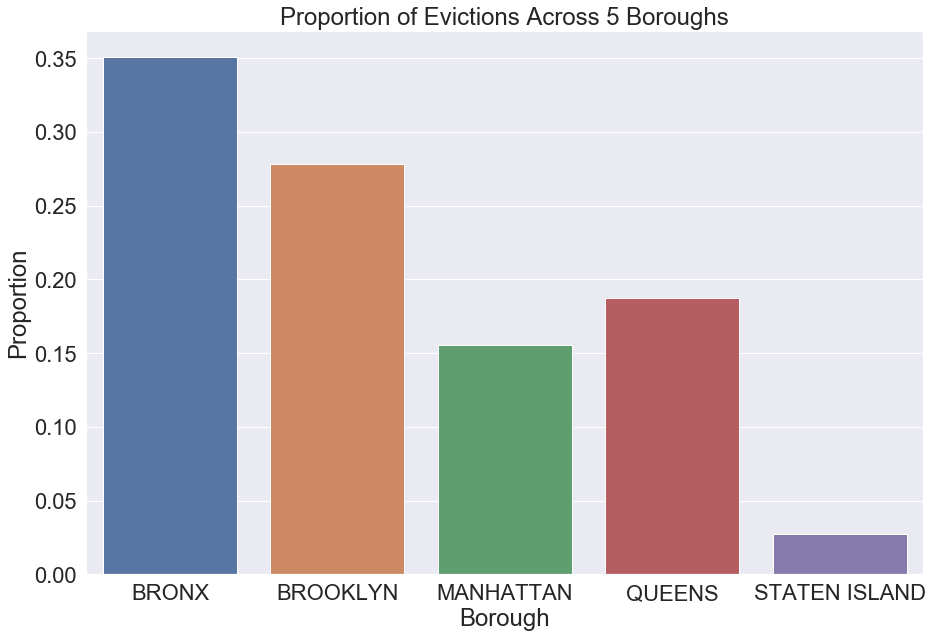

In [94]:
#plotting the number of evictions across all 5 boroughs
ev_g = pd.DataFrame(NY_evictions_new.groupby('BOROUGH').size()).rename(columns = {0: 'Count'}).reset_index()
ev_g['PROP'] = [i/sum(ev_g['Count']) for i in ev_g['Count']]

plt.figure(figsize = (15, 10))
sns.barplot(x = 'BOROUGH', y = 'PROP', data = ev_g)
plt.ylabel('Proportion')
plt.xlabel('Borough')
plt.title('Proportion of Evictions Across 5 Boroughs')
plt.show()

**Created a new table with three columns: Borough, Count, and Proportion. Count is the number of times each Borough appears in the original table and Proportion is the Proportion of each count to the total number of rows in the original table. The above graph shows viewers the proportion of evictions across the five boroughs of NYC. As we can see, the Bronx borough has the highest proportion of evictions over the years.**

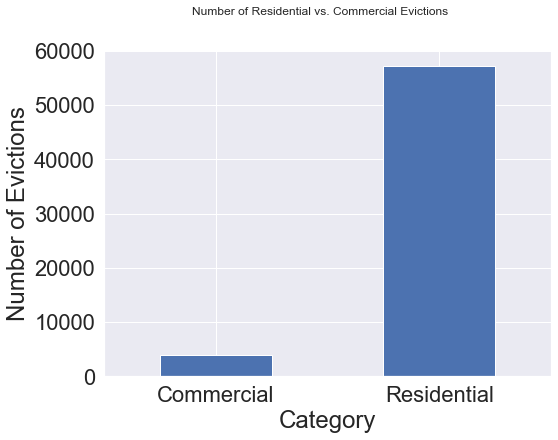

In [95]:
#plotting the number of residential and commercial evictions occur in the entire dataset
residential_versus_commercial = NY_evictions_new.groupby("Residential/Commercial")["Executed Date"].count()
residential_versus_commercial.plot(kind = "bar", figsize = (8, 6))
plt.xlabel("Category")
plt.ylabel("Number of Evictions")
plt.xticks(rotation = 360)
plt.suptitle("Number of Residential vs. Commercial Evictions")
plt.show()

**The above plot shows the number of residential versus commercial evictions that occurred throughout the years in NYC. Clearly, the number of residential evictions outweigh the commercial evictions. This is important to note because individuals from historically lower socioeconomic backgrounds and marginalized races live in residential areas rather than commercial ones.**

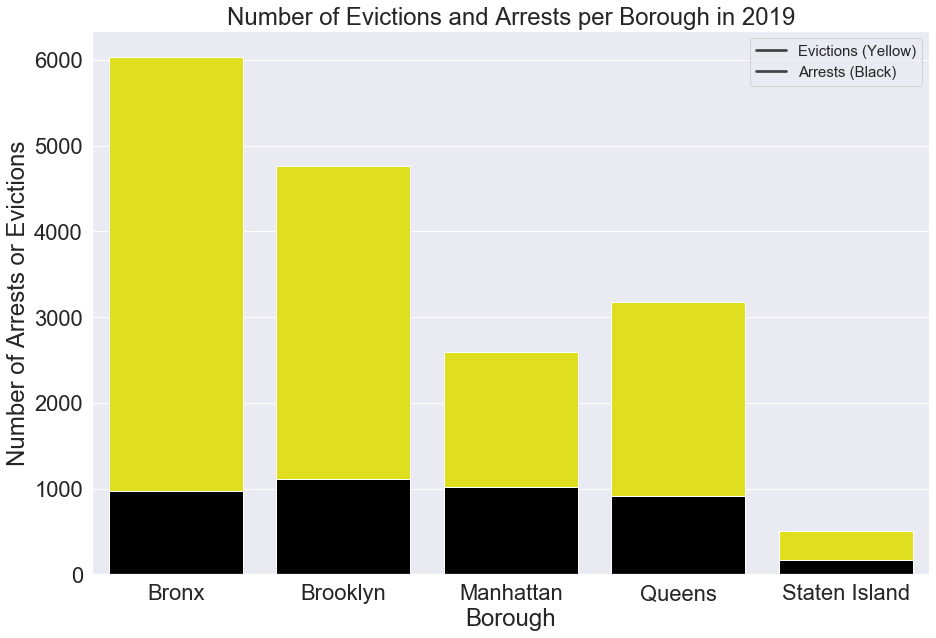

In [96]:
# Visualizing the number of evictions per borough in 2019

NY_evictions_new["year"] = NY_evictions_new["Executed Date"].str.extract("\d{2}\/\d{2}\/(\d{4})")
evictions_2019 = NY_evictions_new[NY_evictions_new["year"] == "2019"]
cleaned = pd.DataFrame(evictions_2019.groupby("BOROUGH").size()).rename(columns = {0: "count"}).reset_index()

arrests_19 = arrests[arrests["year"] == "2019"]

cleaned_arrests = pd.DataFrame(arrests_19.groupby("ARREST_BORO").size()).rename(columns = {0: "count"}).reset_index()

ax = plt.subplots(figsize = (15, 10))
 
ax = sns.barplot(x=cleaned["BOROUGH"], y=cleaned["count"], color = 'yellow')
ax = sns.barplot(x=cleaned_arrests["ARREST_BORO"], y=cleaned_arrests["count"], color = 'black')
 
ax.set(xlabel="Borough", ylabel="Number of Arrests or Evictions", 
       title = "Number of Evictions and Arrests per Borough in 2019")
ax.set_xticklabels(["Bronx",'Brooklyn','Manhattan','Queens', "Staten Island"])

plt.legend(labels = ["Evictions (Yellow)", "Arrests (Black)"], prop = {"size": 15})

#leg = ax.get_legend()
#leg.legendHandles[0].set_color('yellow')
#leg.legendHandles[1].set_color('black')

plt.xticks()
plt.show()

**The layered bar plot allows viewers to see the relationship between the number of arrests and number of evictions per borough in NYC in the year 2019. 2019 is an important year because it was the last year before COVID impacted our dataset. We can see that there were far more evictions (yellow) than arrests (black) in 2019 per borough; however, we can conclude that both the Brooklyn and Manhattan boroughs have the highest number of evictions and arrests in 2019.**

In [97]:
#creating a dataset that is easier to read for users by replacing the encoded values with their actual Borough name
#we group by both year and borough so that we can see the number of arrests that occur in each borough per year
arrests2 = arrests
arrests2['ARREST_BORO'] = arrests['ARREST_BORO'].replace({'B': 'BRONX', 'S': 'STATEN ISLAND', 
                                                          'K': 'BROOKLYN' , 'M': 'MANHATTAN', 'Q': 'QUEENS'})                                               
arrests2 = arrests2.rename(columns = {'ARREST_BORO' : 'BOROUGH'})
arrests2['ONES'] = np.ones(len(arrests2))

grouped = arrests2.groupby(['year', 'BOROUGH']).sum().reset_index()
grouped

,year,BOROUGH,ARREST_KEY,PD_CD,KY_CD,ARREST_PRECINCT,JURISDICTION_CODE,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,index_right,ONES
0,2006,BRONX,30795763954,821411.0,471425.0,76300,4356.0,1.720566e+09,417767994.0,69309.449051,-125396.226599,281016,1697.0
1,2006,BROOKLYN,36760186633,1030378.0,584955.0,150411,3151.0,2.021768e+09,365399189.0,82219.932543,-149514.040471,194858,2022.0
2,2006,MANHATTAN,36225897106,1068591.0,596821.0,38209,3846.0,1.959469e+09,438729414.0,80453.065073,-145938.630939,319351,1973.0
3,2006,QUEENS,23914105774,728693.0,446458.0,142247,2410.0,1.353365e+09,262881482.0,53500.398938,-97019.372605,187962,1314.0
4,2006,STATEN ISLAND,4155671542,122166.0,64051.0,27106,95.0,2.129269e+08,35703457.0,9095.318845,-16603.168745,45618,224.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
70,2020,BRONX,139172527030,255088.0,151258.0,29047,1108.0,6.574532e+08,159466690.0,26465.674098,-47880.946440,110612,648.0
71,2020,BROOKLYN,157623895377,322324.0,163279.0,53674,1510.0,7.324322e+08,130852019.0,29841.493281,-54279.981651,76581,734.0
72,2020,MANHATTAN,122949880560,226014.0,130835.0,10554,1460.0,5.696624e+08,126597799.0,23403.154901,-42459.013597,95672,574.0
73,2020,QUEENS,125936772995,236967.0,142919.0,63212,951.0,6.034420e+08,116438173.0,23857.196259,-43267.806337,83875,586.0


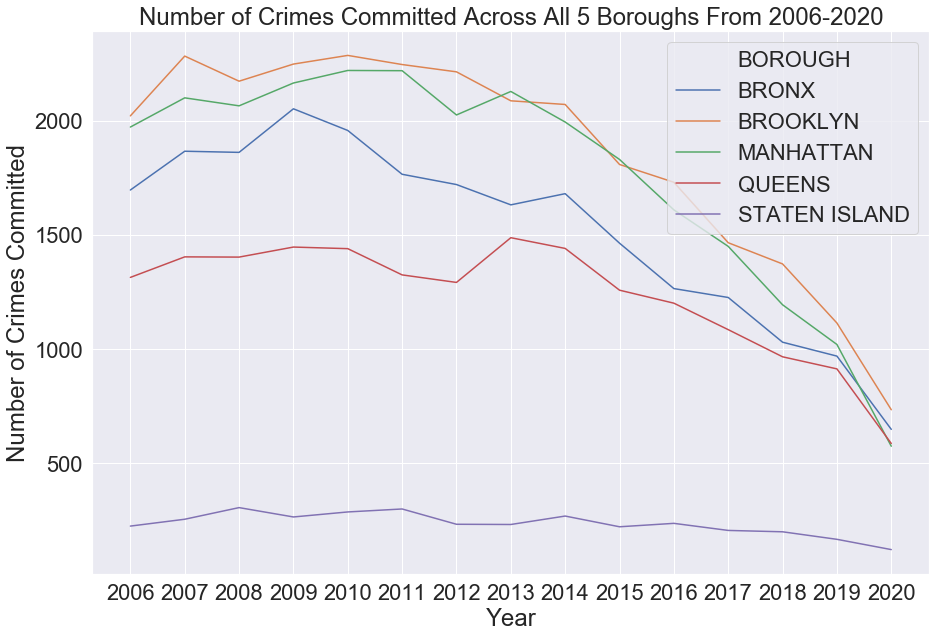

In [98]:
plt.figure(figsize = (15, 10))
sns.lineplot(x = "year", y = 'ONES', data = grouped, hue = 'BOROUGH')
plt.ylabel('Number of Crimes Committed')
plt.xlabel('Year')
plt.title('Number of Crimes Committed Across All 5 Boroughs From 2006-2020')
plt.show()

**The above plot shows the number of crimes committed over the last 14 years across all 5 boroughs. The ones column represents a counter for each row so that, when summing in the grouby step, each borough will have an accurate number of crimes per year. Additionally, we can see that all five boroughs share the same downward trend as a function of time. We can also note that Staten Island has a significantly lower number of crimes compared to the rest of the boroughs and we believe this is because of its low population size compared to other boroughs.**

## Analyzing Arrests and Evictions by Race ##

**In this part, we filtered the arrest data by PERP_RACE and neighborhood and took the count of each (PERP_RACE, neighborhood) pair in the race_count table. The Choropleth map has 6 layers (one for each race) and you can select and delect these layers using LayerControl on the top right of the map.**

In [99]:
#checking how many times each race appears in the dataset
arrests["PERP_RACE"].value_counts().drop(index=["UNKNOWN"])

BLACK                             48456
WHITE HISPANIC                    25768
WHITE                             11817
BLACK HISPANIC                     7908
ASIAN / PACIFIC ISLANDER           4203
AMERICAN INDIAN/ALASKAN NATIVE      242
OTHER                                18
Name: PERP_RACE, dtype: int64

In [100]:
# drop "UNKNOWN" race because we want to focus on known races
races_list = arrests["PERP_RACE"].value_counts().drop(index=["UNKNOWN"]).index.to_list()
races_list

['BLACK',
 'WHITE HISPANIC',
 'WHITE',
 'BLACK HISPANIC',
 'ASIAN / PACIFIC ISLANDER',
 'AMERICAN INDIAN/ALASKAN NATIVE',
 'OTHER']

In [101]:
perp_race = arrests["PERP_RACE"].value_counts()

In [102]:
neighborhoods = arrests["neighborhood"].value_counts()

In [103]:
#creating a table that details how many individuals of each race live in each neighborhood
neighborhood_names = outlines_df["neighborhood"].value_counts().index.tolist()

race_count = arrests[["neighborhood", "PERP_RACE"]].value_counts().reset_index()
race_count = race_count[race_count["PERP_RACE"].isin(races_list)].reset_index().rename(columns={"PERP_RACE":"race", 0:"count"})

for i in neighborhood_names:
    all_i = race_count[race_count["neighborhood"] == i]
    for r in races_list:
        row = all_i[all_i["race"] == r]
        if (all_i.shape[0] == 0) or (row.shape[0] == 0):
            row = pd.DataFrame([[i, r, 0]], columns=["neighborhood", "race", "count"])
            race_count = pd.concat([race_count, row])
            
race_count.sort_values(["neighborhood", "race"], ascending=[False, False])

,index,neighborhood,race,count
179,179.0,Woodside,WHITE HISPANIC,135
445,447.0,Woodside,WHITE,32
0,NaN,Woodside,OTHER,0
577,588.0,Woodside,BLACK HISPANIC,19
387,388.0,Woodside,BLACK,41
...,...,...,...,...
0,NaN,Allerton,OTHER,0
456,458.0,Allerton,BLACK HISPANIC,31
132,132.0,Allerton,BLACK,182
724,755.0,Allerton,ASIAN / PACIFIC ISLANDER,10


**The above table, stemming from our sampled arrests dataset, shows the number of individuals of each race that live in each neighborhood.**

In [105]:
eviction_lats = list(NY_evictions_new["Latitude"].values)
eviction_lons = list(NY_evictions_new["Longitude"].values)
eviction_coordinates = [list(x) for x in zip(eviction_lats, eviction_lons)]
eviction_coordinates_sample = random.sample(eviction_coordinates, 500)
neighborhood_geojson = json.load(open("nyc_neighborhood_outlines2_raw.txt"))

bins = np.arange(0, 3501, 500)
num_legends = 0
nyc_coords = [40.6955, -73.9509]

map_by_race = folium.Map(nyc_coords, zoom_start=11)
for r in races_list:
    c = folium.Choropleth(
        geo_data = neighborhood_geojson,
        data = race_count[race_count["race"] == r],
        columns = ["neighborhood", "count"],
        key_on = "feature.properties.neighborhood",
        fill_color = "Greens",
        fill_opacity = 0.9,
        line_opacity = 0.5,
        legend_name = "Arrest Counts",
        name = r
    )
    
    for key in c._children:
        if num_legends == 0:
            num_legends += 1
            break
        elif key.startswith("color_map"):
            del(c._children[key])
            
    c.add_to(map_by_race)
    
for i in range(len(eviction_coordinates_sample)):
    ## EVICTION INCIDENTS ARE YELLOW ## 
               folium.CircleMarker(eviction_coordinates_sample[i], icon = folium.Icon(color = "black"),
                                                                    radius = 4, 
                                                                    color = "black",
                                                                    fill_color = "yellow",
                                                                    fill = True,
                                                                    fill_opacity = 1).add_to(map_by_race)
    
    
folium.LayerControl().add_to(map_by_race)
    
map_by_race

**The layered choropleth map highlights the relationship between gentrification (specifically eviction) and crime in New York City. As we can see above, viewers are able to adjust the layered choropleth map by race, sorting neighborhoods in NYC by their number of arrests by race. Furthermore, we color-coded the map by a green gradient to detail how crime-filled a neighborhood is. If an area is a darker green, then it appears in our dataset more. Additionally, the yellow dots on the map represent individual eviction incidents and our visualization shows that most evictions occur in the Bronx borough which validates the findings of our layered bar plot in previous cells. Lastly, each yellow dot is taken from a random sample of eviction coordinate pairs in order to prevent the choropleth map from overloading with too many data points.**

In [106]:
heatmap_obj = folium.Map(location = nyc_coords, zoom_start = 10)
heatmap = HeatMap(eviction_coordinates_sample, radius = 17).add_to(heatmap_obj)
heatmap_obj

**According to the heatmap above, we are able to confirm our findings from the layered choropleth map. Most of the data (which consist of the eviction incidents) are clusted around the Bronx borough, which is illustrated by the "red" segment on the top of the heatmap.**

In [107]:
def getCoordinates(df, borough):
    """
    Function that takes in the NYC Eviction or crime dataset and
    one of the five boroughs in NYC and returns a sample of
    the latitude/longitude pairs for that specific borough.
    """
    eviction_df = df[df["BOROUGH"] == borough]
    borough_lat = list(eviction_df["Latitude"].values)
    borough_lon = list(eviction_df["Longitude"].values)
    borough_lat_lon_pairs = [list(x) for x in zip(borough_lat, borough_lon)]
    return random.sample(borough_lat_lon_pairs, 100)

brooklyn_coords = getCoordinates(NY_evictions_new, "BROOKLYN")
bronx_coords = getCoordinates(NY_evictions_new, "BRONX")
staten_island_coords = getCoordinates(NY_evictions_new, "STATEN ISLAND")
queens_coords = getCoordinates(NY_evictions_new, "QUEENS")
manhattan_coords = getCoordinates(NY_evictions_new, "MANHATTAN")

folium_obj = folium.Map(location = nyc_coords, zoom_start = 11)

for i in range(len(brooklyn_coords)):
    ## BROOKLYN IS BLACK ## 
               folium.CircleMarker(brooklyn_coords[i], icon = folium.Icon(color = "black"),
                                                                    radius = 4, 
                                                                    color = "black",
                                                                    fill_color = "black",
                                                                    fill = True,
                                                                    fill_opacity = 1).add_to(folium_obj)
        
for i in range(len(bronx_coords)):
    ## BRONX IS RED ##
             folium.CircleMarker(bronx_coords[i], icon = folium.Icon(color = "black"),
                                                                    radius = 4, 
                                                                    color = "black",
                                                                    fill_color = "red",
                                                                    fill = True,
                                                                    fill_opacity = 1).add_to(folium_obj)
    
for i in range(len(staten_island_coords)):
    ## STATEN ISLAND IS BLUE ##
               folium.CircleMarker(staten_island_coords[i], icon = folium.Icon(color = "black"),
                                                                    radius = 4, 
                                                                    color = "black",
                                                                    fill_color = "blue",
                                                                    fill = True,
                                                                    fill_opacity = 1).add_to(folium_obj)
for i in range(len(queens_coords)):
    ## QUEENS IS GREEN ##
               folium.CircleMarker(queens_coords[i], icon = folium.Icon(color = "black"),
                                                                    radius = 4, 
                                                                    color = "black",
                                                                    fill_color = "green",
                                                                    fill = True,
                                                                    fill_opacity = 1).add_to(folium_obj)
        
for i in range(len(manhattan_coords)):
    ## MANHATTAN IS YELLOW ##
               folium.CircleMarker(manhattan_coords[i], icon = folium.Icon(color = "black"),
                                                                    radius = 4, 
                                                                    color = "black",
                                                                    fill_color = "yellow",
                                                                    fill = True,
                                                                    fill_opacity = 1).add_to(folium_obj)
folium_obj

**The above plot shows viewers the number of evictions per borough in New York City while each borough is color-coded a specific color. Brooklyn is Black, Bronx is Red, Staten Island is Blue, Queens is Green, and Manhattan is Yellow. Additionally, each point on the folium map is taken from a random sample of coordinate pairs in order to prevent the map from overloading with too many data points.**

In [108]:
arrest_lats = list(arrests["Latitude"].values)
arrest_lons = list(arrests["Longitude"].values)
arrest_coordinates = [list(x) for x in zip(arrest_lats, arrest_lons)]
arrest_coordinates_sample = random.sample(arrest_coordinates, 500)

In [109]:
folium_obj = folium.Map(location = nyc_coords, zoom_start = 11)

for i in range(len(arrest_coordinates_sample)):
    ## ARRESTS ARE YELLOW ## 
               folium.CircleMarker(arrest_coordinates_sample[i], icon = folium.Icon(color = "black"),
                                                                    radius = 4, 
                                                                    color = "black",
                                                                    fill_color = "yellow",
                                                                    fill = True,
                                                                    fill_opacity = 1).add_to(folium_obj)
for i in range(len(eviction_coordinates_sample)):
    ## EVICTIONS ARE RED ## 
               folium.CircleMarker(eviction_coordinates_sample[i], icon = folium.Icon(color = "black"),
                                                                    radius = 4, 
                                                                    color = "black",
                                                                    fill_color = "red",
                                                                    fill = True,
                                                                    fill_opacity = 1).add_to(folium_obj)
folium_obj   

**This map shows the relationship between crime and gentrification (specifically eviction) in New York City. In our proposal, we hypothesized that eviction is one of the most prevalent factors of gentrification. This idea is showcased through the clustering of eviction and arrests by region (such as the Bronx). Because of the clustering, we can conclude that there exists a relationship between crime and evictions. Later on in our analysis, we will test various regression models in order to predict crime as a function of evictions.**

# Part 2: Modeling & Prediction #

In [110]:
NY_evictions_new.head(3)

,Executed Date,Residential/Commercial,BOROUGH,Eviction Postcode,Eviction/Legal Possession,Latitude,Longitude,Council District,BIN,BBL,year
0,08/16/2019,Residential,BROOKLYN,11225,Possession,40.661502,-73.951910,40.0,3035375.0,3.013290e+09,2019
1,04/16/2018,Residential,BROOKLYN,11225,Possession,40.664977,-73.959031,35.0,3388698.0,3.013020e+09,2018
2,10/17/2017,Residential,BROOKLYN,11237,Possession,40.697203,-73.918022,37.0,3075674.0,3.033070e+09,2017


In [111]:
arrests.head(3)

,ARREST_KEY,ARREST_DATE,PD_CD,PD_DESC,KY_CD,OFNS_DESC,LAW_CODE,LAW_CAT_CD,ARREST_BORO,ARREST_PRECINCT,JURISDICTION_CODE,AGE_GROUP,PERP_SEX,PERP_RACE,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,Lon_Lat,year,Point,index_right,neighborhood
0,74040476,08/07/2010,905.0,"INTOXICATED DRIVING,ALCOHOL",347.0,INTOXICATED & IMPAIRED DRIVING,VTL11920M3,M,QUEENS,110,0.0,18-24,M,BLACK HISPANIC,1019164.0,210169.0,40.743481,-73.874004,POINT (-73.87400353699996 40.743481264000025),2010,POINT (-73.87400 40.74348),91,Elmhurst
167,49297232,07/29/2008,397.0,"ROBBERY,UNCLASSIFIED,OPEN AREAS",105.0,ROBBERY,PL 1601001,F,QUEENS,110,0.0,<18,M,WHITE HISPANIC,1019165.0,210453.0,40.744261,-73.873998,POINT (-73.87399845399995 40.74426076900005),2008,POINT (-73.87400 40.74426),91,Elmhurst
297,205851255,12/01/2019,101.0,ASSAULT 3,344.0,ASSAULT 3 & RELATED OFFENSES,PL 1200001,M,QUEENS,110,0.0,45-64,M,WHITE HISPANIC,1019165.0,210166.0,40.743473,-73.874000,POINT (-73.87399994399993 40.74347302600006),2019,POINT (-73.87400 40.74347),91,Elmhurst


In [112]:
pd.set_option('display.max_columns', None)
# add month column to arrest table 
arrests["month"] = arrests["ARREST_DATE"].str.extract(r"(\d{2})\/\d{2}\/\d{4}").astype(int)

# change data type of "year" column from string to int
arrests["year"] = arrests["year"].astype(int)
arrests.head(3)

,ARREST_KEY,ARREST_DATE,PD_CD,PD_DESC,KY_CD,OFNS_DESC,LAW_CODE,LAW_CAT_CD,ARREST_BORO,ARREST_PRECINCT,JURISDICTION_CODE,AGE_GROUP,PERP_SEX,PERP_RACE,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,Lon_Lat,year,Point,index_right,neighborhood,month
0,74040476,08/07/2010,905.0,"INTOXICATED DRIVING,ALCOHOL",347.0,INTOXICATED & IMPAIRED DRIVING,VTL11920M3,M,QUEENS,110,0.0,18-24,M,BLACK HISPANIC,1019164.0,210169.0,40.743481,-73.874004,POINT (-73.87400353699996 40.743481264000025),2010,POINT (-73.87400 40.74348),91,Elmhurst,8
167,49297232,07/29/2008,397.0,"ROBBERY,UNCLASSIFIED,OPEN AREAS",105.0,ROBBERY,PL 1601001,F,QUEENS,110,0.0,<18,M,WHITE HISPANIC,1019165.0,210453.0,40.744261,-73.873998,POINT (-73.87399845399995 40.74426076900005),2008,POINT (-73.87400 40.74426),91,Elmhurst,7
297,205851255,12/01/2019,101.0,ASSAULT 3,344.0,ASSAULT 3 & RELATED OFFENSES,PL 1200001,M,QUEENS,110,0.0,45-64,M,WHITE HISPANIC,1019165.0,210166.0,40.743473,-73.874000,POINT (-73.87399994399993 40.74347302600006),2019,POINT (-73.87400 40.74347),91,Elmhurst,12


In [113]:
arrests.columns

Index(['ARREST_KEY', 'ARREST_DATE', 'PD_CD', 'PD_DESC', 'KY_CD', 'OFNS_DESC',
       'LAW_CODE', 'LAW_CAT_CD', 'ARREST_BORO', 'ARREST_PRECINCT',
       'JURISDICTION_CODE', 'AGE_GROUP', 'PERP_SEX', 'PERP_RACE', 'X_COORD_CD',
       'Y_COORD_CD', 'Latitude', 'Longitude', 'Lon_Lat', 'year', 'Point',
       'index_right', 'neighborhood', 'month'],
      dtype='object')

In [114]:
# adds "crime_count" column to arrests table, where crime count represents
# the total number of crimes per month per year
crime_count = arrests[["year", "month", "neighborhood"]].value_counts().reset_index().rename(columns={0:"crime_count"})
arrests = arrests.merge(crime_count, on=["year", "month", "neighborhood"])
arrests

,ARREST_KEY,ARREST_DATE,PD_CD,PD_DESC,KY_CD,OFNS_DESC,LAW_CODE,LAW_CAT_CD,ARREST_BORO,ARREST_PRECINCT,JURISDICTION_CODE,AGE_GROUP,PERP_SEX,PERP_RACE,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,Lon_Lat,year,Point,index_right,neighborhood,month,crime_count
0,74040476,08/07/2010,905.0,"INTOXICATED DRIVING,ALCOHOL",347.0,INTOXICATED & IMPAIRED DRIVING,VTL11920M3,M,QUEENS,110,0.0,18-24,M,BLACK HISPANIC,1019164.0,210169.0,40.743481,-73.874004,POINT (-73.87400353699996 40.743481264000025),2010,POINT (-73.87400 40.74348),91,Elmhurst,8,12
1,74058935,08/09/2010,847.0,"NY STATE LAWS,UNCLASSIFIED FELONY",125.0,OTHER STATE LAWS,LOC00000AF,F,QUEENS,110,0.0,18-24,M,WHITE HISPANIC,1017544.0,211839.0,40.748071,-73.879842,POINT (-73.87984153199994 40.74807123900007),2010,POINT (-73.87984 40.74807),91,Elmhurst,8,12
2,74032700,08/06/2010,705.0,"FORGERY,ETC.-MISD.",358.0,OFFENSES INVOLVING FRAUD,PL 1657100,M,QUEENS,110,0.0,45-64,M,UNKNOWN,1020182.0,206551.0,40.733547,-73.870349,POINT (-73.870349101 40.733546682000046),2010,POINT (-73.87035 40.73355),91,Elmhurst,8,12
3,74301907,08/24/2010,478.0,"THEFT OF SERVICES, UNCLASSIFIED",343.0,OTHER OFFENSES RELATED TO THEFT,PL 1651503,M,QUEENS,110,1.0,18-24,M,BLACK HISPANIC,1018154.0,207719.0,40.736761,-73.877661,POINT (-73.87766077599997 40.736760557000025),2010,POINT (-73.87766 40.73676),91,Elmhurst,8,12
4,74011777,08/05/2010,478.0,"THEFT OF SERVICES, UNCLASSIFIED",343.0,OTHER OFFENSES RELATED TO THEFT,PL 1651503,M,QUEENS,110,1.0,<18,M,BLACK,1020182.0,206551.0,40.733547,-73.870349,POINT (-73.870349101 40.733546682000046),2010,POINT (-73.87035 40.73355),91,Elmhurst,8,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99349,23874237,08/15/2006,490.0,"STOLEN PROPERTY 3,POSSESSION",232.0,POSSESSION OF STOLEN PROPERTY 5,PL 1654000,M,STATEN ISLAND,122,0.0,<18,M,BLACK HISPANIC,948540.0,146332.0,40.568260,-74.128534,POINT (-74.12853392399995 40.568259711000046),2006,POINT (-74.12853 40.56826),250,Richmondtown,8,1
99350,37323246,12/28/2007,258.0,"CRIMINAL MISCHIEF 4TH, GRAFFITI",351.0,CRIMINAL MISCHIEF & RELATED OFFENSES,PL 1456002,M,STATEN ISLAND,122,0.0,<18,M,WHITE,947529.0,147162.0,40.570534,-74.132177,POINT (-74.13217735999996 40.570533768000075),2007,POINT (-74.13218 40.57053),250,Richmondtown,12,1
99351,142419691,04/25/2015,905.0,"INTOXICATED DRIVING,ALCOHOL",347.0,INTOXICATED & IMPAIRED DRIVING,VTL11920U2,M,BROOKLYN,66,0.0,18-24,M,ASIAN / PACIFIC ISLANDER,987483.0,174108.0,40.644570,-73.988351,POINT (-73.98835146699997 40.644570489000046),2015,POINT (-73.98835 40.64457),124,Green-Wood Cemetery,4,1
99352,86514762,08/30/2012,729.0,"FORGERY,ETC.,UNCLASSIFIED-FELONY",113.0,FORGERY,PL 1702500,F,BROOKLYN,72,0.0,25-44,M,WHITE HISPANIC,989492.0,176669.0,40.651599,-73.981110,POINT (-73.98111013299997 40.651598920000026),2012,POINT (-73.98111 40.65160),124,Green-Wood Cemetery,8,1


In [115]:
NY_evictions_new.rename(columns = {"BOROUGH": "ARREST_BORO"}, inplace = True)
NY_evictions_new

,Executed Date,Residential/Commercial,ARREST_BORO,Eviction Postcode,Eviction/Legal Possession,Latitude,Longitude,Council District,BIN,BBL,year
0,08/16/2019,Residential,BROOKLYN,11225,Possession,40.661502,-73.951910,40.0,3035375.0,3.013290e+09,2019
1,04/16/2018,Residential,BROOKLYN,11225,Possession,40.664977,-73.959031,35.0,3388698.0,3.013020e+09,2018
2,10/17/2017,Residential,BROOKLYN,11237,Possession,40.697203,-73.918022,37.0,3075674.0,3.033070e+09,2017
3,06/27/2017,Residential,BRONX,10455,Possession,40.816478,-73.909699,17.0,2004460.0,2.026240e+09,2017
4,01/22/2019,Residential,QUEENS,11414,Possession,40.668237,-73.849362,32.0,4434842.0,4.114310e+09,2019
...,...,...,...,...,...,...,...,...,...,...,...
67722,02/16/2018,Residential,QUEENS,11373,Possession,40.742171,-73.880699,25.0,4037523.0,4.015180e+09,2018
67723,03/10/2020,Residential,QUEENS,11435,Possession,40.708943,-73.814336,24.0,4440741.0,4.097100e+09,2020
67724,04/12/2018,Residential,MANHATTAN,10001,Possession,40.746602,-73.991829,3.0,1015100.0,1.008040e+09,2018
67725,02/14/2019,Residential,BRONX,10474,Possession,40.815774,-73.885852,17.0,2006567.0,2.027630e+09,2019


In [116]:
# our ultimate goal is to join eviction data with ny arrest data on neighborhoods, so we will 
# place each eviction in a neighborhood based on latitude and longitude columns

NY_evictions_new = gpd.GeoDataFrame(NY_evictions_new, geometry=gpd.points_from_xy(
    NY_evictions_new.Longitude, NY_evictions_new.Latitude))
nyc_outlines_table = gpd.read_file("nyc_neighborhood_outlines2.geojson")

if "neighborhood" not in list(NY_evictions_new.columns):
    NY_evictions_new = NY_evictions_new.sjoin(nyc_outlines_table)
NY_evictions_new

/Applications/anaconda3/lib/python3.7/site-packages/geopandas/geodataframe.py:1938: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  return geopandas.sjoin(left_df=self, right_df=df, *args, **kwargs)


,Executed Date,Residential/Commercial,ARREST_BORO,Eviction Postcode,Eviction/Legal Possession,Latitude,Longitude,Council District,BIN,BBL,year,geometry,index_right,neighborhood,boroughCode,borough,@id
0,08/16/2019,Residential,BROOKLYN,11225,Possession,40.661502,-73.951910,40.0,3035375.0,3.013290e+09,2019,POINT (-73.95191 40.66150),243,Prospect-Lefferts Gardens,3,Brooklyn,http://nyc.pediacities.com/Resource/Neighborho...
235,03/05/2018,Residential,BROOKLYN,11225,Possession,40.658121,-73.960444,40.0,3114633.0,3.050260e+09,2018,POINT (-73.96044 40.65812),243,Prospect-Lefferts Gardens,3,Brooklyn,http://nyc.pediacities.com/Resource/Neighborho...
259,06/01/2017,Residential,BROOKLYN,11225,Possession,40.662742,-73.944708,40.0,3035150.0,3.013240e+09,2017,POINT (-73.94471 40.66274),243,Prospect-Lefferts Gardens,3,Brooklyn,http://nyc.pediacities.com/Resource/Neighborho...
538,11/16/2017,Residential,BROOKLYN,11225,Possession,40.656758,-73.962186,40.0,3114672.0,3.050260e+09,2017,POINT (-73.96219 40.65676),243,Prospect-Lefferts Gardens,3,Brooklyn,http://nyc.pediacities.com/Resource/Neighborho...
753,01/09/2017,Residential,BROOKLYN,11225,Possession,40.656583,-73.958416,40.0,3115809.0,3.050480e+09,2017,POINT (-73.95842 40.65658),243,Prospect-Lefferts Gardens,3,Brooklyn,http://nyc.pediacities.com/Resource/Neighborho...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45204,05/18/2018,Residential,QUEENS,11693,Possession,40.608509,-73.817940,32.0,4297369.0,4.154540e+09,2018,POINT (-73.81794 40.60851),37,Broad Channel,4,Queens,http://nyc.pediacities.com/Resource/Neighborho...
56564,07/13/2018,Residential,QUEENS,11693,Possession,40.605597,-73.818412,32.0,4311010.0,4.154760e+09,2018,POINT (-73.81841 40.60560),37,Broad Channel,4,Queens,http://nyc.pediacities.com/Resource/Neighborho...
34066,09/12/2018,Residential,QUEENS,11375,Possession,40.719319,-73.834906,29.0,4052770.0,4.022650e+09,2018,POINT (-73.83491 40.71932),104,Flushing Meadows Corona Park,4,Queens,http://nyc.pediacities.com/Resource/Neighborho...
47345,03/08/2018,Commercial,STATEN ISLAND,10314,Possession,40.610615,-74.184691,50.0,5151772.0,5.017800e+09,2018,POINT (-74.18469 40.61062),22,Bloomfield,5,Staten Island,http://nyc.pediacities.com/Resource/Neighborho...


In [117]:
# add "month" column to NY_evictions new 
NY_evictions_new["month"] = NY_evictions_new["Executed Date"].str.extract(r"(\d{2})\/\d{2}\/\d{4}").astype(int)

# convert year column to int values 
NY_evictions_new["year"] = NY_evictions_new["year"].astype(int)

# create counts table of number of evictions based on month, year, borough, and residential/commericial 
evictions_count = NY_evictions_new[["month", "year", "neighborhood", "Residential/Commercial"]].value_counts().reset_index().rename(columns={0:"eviction_count"})

evictions_count

,month,year,neighborhood,Residential/Commercial,eviction_count
0,1,2018,Fordham,Residential,79
1,10,2017,Fordham,Residential,76
2,1,2017,East Flatbush,Residential,73
3,5,2017,Fordham,Residential,73
4,1,2017,Fordham,Residential,72
...,...,...,...,...,...
8962,4,2018,Floral Park,Commercial,1
8963,4,2018,Flatlands,Commercial,1
8964,4,2018,Emerson Hill,Residential,1
8965,9,2018,Park Slope,Residential,1


In [118]:
# merge eviction counts to arrests table on the month, year, and ny neighborhood
arrests = arrests.merge(evictions_count, on=["month", "year", "neighborhood"])
print(arrests.columns)
arrests.head(1)

Index(['ARREST_KEY', 'ARREST_DATE', 'PD_CD', 'PD_DESC', 'KY_CD', 'OFNS_DESC',
       'LAW_CODE', 'LAW_CAT_CD', 'ARREST_BORO', 'ARREST_PRECINCT',
       'JURISDICTION_CODE', 'AGE_GROUP', 'PERP_SEX', 'PERP_RACE', 'X_COORD_CD',
       'Y_COORD_CD', 'Latitude', 'Longitude', 'Lon_Lat', 'year', 'Point',
       'index_right', 'neighborhood', 'month', 'crime_count',
       'Residential/Commercial', 'eviction_count'],
      dtype='object')


,ARREST_KEY,ARREST_DATE,PD_CD,PD_DESC,KY_CD,OFNS_DESC,LAW_CODE,LAW_CAT_CD,ARREST_BORO,ARREST_PRECINCT,JURISDICTION_CODE,AGE_GROUP,PERP_SEX,PERP_RACE,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,Lon_Lat,year,Point,index_right,neighborhood,month,crime_count,Residential/Commercial,eviction_count
0,205851255,12/01/2019,101.0,ASSAULT 3,344.0,ASSAULT 3 & RELATED OFFENSES,PL 1200001,M,QUEENS,110,0.0,45-64,M,WHITE HISPANIC,1019165.0,210166.0,40.743473,-73.874,POINT (-73.87399994399993 40.74347302600006),2019,POINT (-73.87400 40.74347),91,Elmhurst,12,3,Commercial,1


In [119]:
# import NYC housing data, clean and merge with arrests table based on date, month, and neighborhood 

ny_housing = pd.read_csv("Housing_New_York_Units_by_Building.csv")
ny_housing.head(1)

,Project ID,Project Name,Project Start Date,Project Completion Date,Building ID,Number,Street,Borough,Postcode,BBL,BIN,Community Board,Council District,Census Tract,NTA - Neighborhood Tabulation Area,Latitude,Longitude,Latitude (Internal),Longitude (Internal),Building Completion Date,Reporting Construction Type,Extended Affordability Only,Prevailing Wage Status,Extremely Low Income Units,Very Low Income Units,Low Income Units,Moderate Income Units,Middle Income Units,Other Income Units,Studio Units,1-BR Units,2-BR Units,3-BR Units,4-BR Units,5-BR Units,6-BR+ Units,Unknown-BR Units,Counted Rental Units,Counted Homeownership Units,All Counted Units,Total Units
0,65390,81 - 95 LENOX AVENUE AKA CANAAN IV TOWERS,12/30/2021,NaN,842019.0,95,LENOX AVENUE,Manhattan,10026.0,1.018240e+09,1055038.0,MN-10,9.0,218,MN11,40.801226,-73.950278,40.8013,-73.951044,NaN,Preservation,No,Non Prevailing Wage,127,11,12,0,10,1,0,63,89,9,0,0,0,0,161,0,161,161


In [120]:
# create new month and year columns

ny_housing["month"] = ny_housing["Project Start Date"].str.extract(r"(\d{2})\/\d{2}\/\d{4}").astype(int)
ny_housing["year"] = ny_housing["Project Start Date"].str.extract(r"\d{2}\/\d{2}\/(\d{4})").astype(int)

In [121]:
# runs following code once
# code does a spatial join of ny_housing data with corresponding neighborhoods

if "neighborhood" not in list(ny_housing.columns):
    ny_housing = gpd.GeoDataFrame(ny_housing, geometry=gpd.points_from_xy(
    ny_housing.Longitude, ny_housing.Latitude))
    ny_housing = ny_housing.sjoin(nyc_outlines_table)

ny_housing.head()

/Applications/anaconda3/lib/python3.7/site-packages/geopandas/geodataframe.py:1938: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  return geopandas.sjoin(left_df=self, right_df=df, *args, **kwargs)


,Project ID,Project Name,Project Start Date,Project Completion Date,Building ID,Number,Street,Borough,Postcode,BBL,BIN,Community Board,Council District,Census Tract,NTA - Neighborhood Tabulation Area,Latitude,Longitude,Latitude (Internal),Longitude (Internal),Building Completion Date,Reporting Construction Type,Extended Affordability Only,Prevailing Wage Status,Extremely Low Income Units,Very Low Income Units,Low Income Units,Moderate Income Units,Middle Income Units,Other Income Units,Studio Units,1-BR Units,2-BR Units,3-BR Units,4-BR Units,5-BR Units,6-BR+ Units,Unknown-BR Units,Counted Rental Units,Counted Homeownership Units,All Counted Units,Total Units,month,year,geometry,index_right,neighborhood,boroughCode,borough,@id
0,65390,81 - 95 LENOX AVENUE AKA CANAAN IV TOWERS,12/30/2021,NaN,842019.0,95,LENOX AVENUE,Manhattan,10026.0,1.018240e+09,1055038.0,MN-10,9.0,218,MN11,40.801226,-73.950278,40.80130,-73.951044,NaN,Preservation,No,Non Prevailing Wage,127,11,12,0,10,1,0,63,89,9,0,0,0,0,161,0,161,161,12,2021,POINT (-73.95028 40.80123),128,Harlem,1,Manhattan,http://nyc.pediacities.com/Resource/Neighborho...
32,64689,NME III,12/22/2021,NaN,994120.0,207,WEST 140 STREET,Manhattan,10030.0,1.020260e+09,NaN,MN-10,9.0,230,MN03,40.818736,-73.941995,40.81898,-73.942027,NaN,New Construction,No,Non Prevailing Wage,0,0,0,21,0,0,0,10,11,0,0,0,0,0,0,21,21,21,12,2021,POINT (-73.94200 40.81874),128,Harlem,1,Manhattan,http://nyc.pediacities.com/Resource/Neighborho...
33,64689,NME III,12/22/2021,NaN,994121.0,304,WEST 150 STREET,Manhattan,10039.0,1.020450e+09,NaN,MN-10,9.0,259,MN03,40.826069,-73.939785,40.82604,-73.940298,NaN,New Construction,No,Non Prevailing Wage,0,0,0,31,0,0,1,11,8,11,0,0,0,0,0,31,31,31,12,2021,POINT (-73.93979 40.82607),128,Harlem,1,Manhattan,http://nyc.pediacities.com/Resource/Neighborho...
202,68892,WEST END. 15 W 118TH ST,08/25/2021,NaN,805885.0,17,WEST 118 STREET,Manhattan,10026.0,1.017170e+09,NaN,MN-10,9.0,190,MN11,40.802328,-73.946333,40.80265,-73.946553,NaN,New Construction,No,Non Prevailing Wage,50,0,0,0,0,1,50,1,0,0,0,0,0,0,51,0,51,51,8,2021,POINT (-73.94633 40.80233),128,Harlem,1,Manhattan,http://nyc.pediacities.com/Resource/Neighborho...
287,65358,WEST 135TH ST. CLUSTER.YR15.FY21,06/30/2021,06/30/2021,5563.0,1453,AMSTERDAM AVENUE,Manhattan,10027.0,1.019700e+09,1059643.0,MN-09,9.0,21303,MN06,40.816754,-73.953789,40.81665,-73.953475,06/30/2021,Preservation,Yes,Non Prevailing Wage,0,6,3,0,0,0,0,0,9,0,0,0,0,0,9,0,9,9,6,2021,POINT (-73.95379 40.81675),128,Harlem,1,Manhattan,http://nyc.pediacities.com/Resource/Neighborho...


In [122]:
ny_housing.columns

Index(['Project ID', 'Project Name', 'Project Start Date',
       'Project Completion Date', 'Building ID', 'Number', 'Street', 'Borough',
       'Postcode', 'BBL', 'BIN', 'Community Board', 'Council District',
       'Census Tract', 'NTA - Neighborhood Tabulation Area', 'Latitude',
       'Longitude', 'Latitude (Internal)', 'Longitude (Internal)',
       'Building Completion Date', 'Reporting Construction Type',
       'Extended Affordability Only', 'Prevailing Wage Status',
       'Extremely Low Income Units', 'Very Low Income Units',
       'Low Income Units', 'Moderate Income Units', 'Middle Income Units',
       'Other Income Units', 'Studio Units', '1-BR Units', '2-BR Units',
       '3-BR Units', '4-BR Units', '5-BR Units', '6-BR+ Units',
       'Unknown-BR Units', 'Counted Rental Units',
       'Counted Homeownership Units', 'All Counted Units', 'Total Units',
       'month', 'year', 'geometry', 'index_right', 'neighborhood',
       'boroughCode', 'borough', '@id'],
      dtype=

In [123]:
ny_income_housing_types = ['Extremely Low Income Units', 'Very Low Income Units', 'Low Income Units', 
                    'Moderate Income Units', 'Middle Income Units', 
                    "Other Income Units", "Studio Units", "1-BR Units", "2-BR Units", 
                    "3-BR Units", "4-BR Units", "5-BR Units", "6-BR+ Units", 
                    "Unknown-BR Units", "Counted Rental Units", "Counted Homeownership Units", 
                    "All Counted Units", "Total Units"]

ny_housing_counts = ny_housing.groupby(["month", "year", "neighborhood"]).sum().reset_index()
ny_housing_counts = ny_housing_counts[["month", "year", "neighborhood"] + ny_income_housing_types]
ny_housing_counts

,month,year,neighborhood,Extremely Low Income Units,Very Low Income Units,Low Income Units,Moderate Income Units,Middle Income Units,Other Income Units,Studio Units,1-BR Units,2-BR Units,3-BR Units,4-BR Units,5-BR Units,6-BR+ Units,Unknown-BR Units,Counted Rental Units,Counted Homeownership Units,All Counted Units,Total Units
0,1,2014,Belmont,0,0,177,0,0,3,2,63,78,37,0,0,0,0,180,0,180,180
1,1,2014,East New York,0,153,121,0,0,4,73,88,95,22,0,0,0,0,278,0,278,278
2,1,2014,Mott Haven,0,28,107,0,0,1,0,7,83,46,0,0,0,0,136,0,136,136
3,1,2014,Upper West Side,0,0,0,10,0,0,0,9,1,0,0,0,0,0,10,0,10,10
4,1,2015,Bushwick,0,0,2,0,0,0,0,1,1,0,0,0,0,0,2,0,2,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1462,12,2021,Tremont,8,55,16,0,16,1,3,32,42,15,4,0,0,0,96,0,96,130
1463,12,2021,University Heights,0,0,0,18,0,0,2,14,2,0,0,0,0,0,18,0,18,54
1464,12,2021,Upper West Side,11,0,21,35,0,1,35,14,17,2,0,0,0,0,68,0,68,171
1465,12,2021,West Farms,278,0,0,0,16,1,10,57,80,137,11,0,0,0,295,0,295,327


In [124]:
# RUN MERGE ONCE

arrests = arrests.merge(ny_housing_counts, on=["month", "year", "neighborhood"])
arrests

,ARREST_KEY,ARREST_DATE,PD_CD,PD_DESC,KY_CD,OFNS_DESC,LAW_CODE,LAW_CAT_CD,ARREST_BORO,ARREST_PRECINCT,JURISDICTION_CODE,AGE_GROUP,PERP_SEX,PERP_RACE,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,Lon_Lat,year,Point,index_right,neighborhood,month,crime_count,Residential/Commercial,eviction_count,Extremely Low Income Units,Very Low Income Units,Low Income Units,Moderate Income Units,Middle Income Units,Other Income Units,Studio Units,1-BR Units,2-BR Units,3-BR Units,4-BR Units,5-BR Units,6-BR+ Units,Unknown-BR Units,Counted Rental Units,Counted Homeownership Units,All Counted Units,Total Units
0,174592914,02/09/2018,101.0,ASSAULT 3,344.0,ASSAULT 3 & RELATED OFFENSES,PL 1200001,M,BRONX,46,0.0,18-24,M,BLACK HISPANIC,1012119.0,252873.0,40.860717,-73.899250,POINT (-73.89925031699994 40.86071697500005),2018,POINT (-73.89925 40.86072),105,Fordham,2,7,Residential,49,0,17,7,0,0,0,1,6,17,0,0,0,0,0,24,0,24,24
1,174592914,02/09/2018,101.0,ASSAULT 3,344.0,ASSAULT 3 & RELATED OFFENSES,PL 1200001,M,BRONX,46,0.0,18-24,M,BLACK HISPANIC,1012119.0,252873.0,40.860717,-73.899250,POINT (-73.89925031699994 40.86071697500005),2018,POINT (-73.89925 40.86072),105,Fordham,2,7,Commercial,1,0,17,7,0,0,0,1,6,17,0,0,0,0,0,24,0,24,24
2,175156924,02/24/2018,567.0,"MARIJUANA, POSSESSION 4 & 5",235.0,DANGEROUS DRUGS,PL 2211001,M,BRONX,52,0.0,18-24,M,BLACK HISPANIC,1014934.0,255507.0,40.867937,-73.889062,POINT (-73.889061568 40.86793716900007),2018,POINT (-73.88906 40.86794),105,Fordham,2,7,Residential,49,0,17,7,0,0,0,1,6,17,0,0,0,0,0,24,0,24,24
3,175156924,02/24/2018,567.0,"MARIJUANA, POSSESSION 4 & 5",235.0,DANGEROUS DRUGS,PL 2211001,M,BRONX,52,0.0,18-24,M,BLACK HISPANIC,1014934.0,255507.0,40.867937,-73.889062,POINT (-73.889061568 40.86793716900007),2018,POINT (-73.88906 40.86794),105,Fordham,2,7,Commercial,1,0,17,7,0,0,0,1,6,17,0,0,0,0,0,24,0,24,24
4,175126924,02/23/2018,567.0,"MARIJUANA, POSSESSION 4 & 5",235.0,DANGEROUS DRUGS,PL 2211001,M,BRONX,52,0.0,18-24,M,BLACK,1013049.0,253439.0,40.862267,-73.895886,POINT (-73.89588578099993 40.86226749000008),2018,POINT (-73.89589 40.86227),105,Fordham,2,7,Residential,49,0,17,7,0,0,0,1,6,17,0,0,0,0,0,24,0,24,24
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4964,171673227,11/17/2017,922.0,"TRAFFIC,UNCLASSIFIED MISDEMEAN",348.0,VEHICLE AND TRAFFIC LAWS,VTL0511001,M,QUEENS,100,0.0,25-44,M,WHITE HISPANIC,1036992.0,154460.0,40.590484,-73.810102,POINT (-73.81010170799993 40.59048447600002),2017,POINT (-73.81010 40.59048),254,Rockaway Beach,11,1,Residential,1,0,1029,120,0,0,0,60,244,725,120,0,0,0,0,0,1149,1149,1149
4965,196085583,04/16/2019,847.0,"NY STATE LAWS,UNCLASSIFIED FEL",125.0,NYS LAWS-UNCLASSIFIED FELONY,VTL05110FE,F,BRONX,45,0.0,18-24,M,WHITE,1025623.0,245129.0,40.839409,-73.850479,POINT (-73.85047894399997 40.83940905700007),2019,POINT (-73.85048 40.83941),299,Westchester Square,4,2,Residential,2,0,0,0,0,3,0,0,2,0,1,0,0,0,0,3,0,3,7
4966,196268392,04/21/2019,114.0,OBSTR BREATH/CIRCUL,344.0,ASSAULT 3 & RELATED OFFENSES,PL 1211100,M,BRONX,45,0.0,25-44,M,WHITE HISPANIC,1025144.0,245986.0,40.841764,-73.852205,POINT (-73.85220482699998 40.84176350100006),2019,POINT (-73.85220 40.84176),299,Westchester Square,4,2,Residential,2,0,0,0,0,3,0,0,2,0,1,0,0,0,0,3,0,3,7
4967,181641792,05/04/2018,511.0,"CONTROLLED SUBSTANCE, POSSESSION 7",235.0,DANGEROUS DRUGS,PL 2200300,M,STATEN ISLAND,120,0.0,45-64,M,WHITE HISPANIC,961172.0,162476.0,40.612614,-74.083122,POINT (-74.08312221699998 40.61261362700003),2018,POINT (-74.08312 40.61261),213,Park Hill,5,1,Residential,10,0,0,74,0,0,0,0,0,4,70,0,0,0,0,0,74,74,74


In [125]:
arrests.columns

Index(['ARREST_KEY', 'ARREST_DATE', 'PD_CD', 'PD_DESC', 'KY_CD', 'OFNS_DESC',
       'LAW_CODE', 'LAW_CAT_CD', 'ARREST_BORO', 'ARREST_PRECINCT',
       'JURISDICTION_CODE', 'AGE_GROUP', 'PERP_SEX', 'PERP_RACE', 'X_COORD_CD',
       'Y_COORD_CD', 'Latitude', 'Longitude', 'Lon_Lat', 'year', 'Point',
       'index_right', 'neighborhood', 'month', 'crime_count',
       'Residential/Commercial', 'eviction_count',
       'Extremely Low Income Units', 'Very Low Income Units',
       'Low Income Units', 'Moderate Income Units', 'Middle Income Units',
       'Other Income Units', 'Studio Units', '1-BR Units', '2-BR Units',
       '3-BR Units', '4-BR Units', '5-BR Units', '6-BR+ Units',
       'Unknown-BR Units', 'Counted Rental Units',
       'Counted Homeownership Units', 'All Counted Units', 'Total Units'],
      dtype='object')

In [126]:
arrests.isnull().sum()

ARREST_KEY                     0
ARREST_DATE                    0
PD_CD                          0
PD_DESC                        0
KY_CD                          0
OFNS_DESC                      0
LAW_CODE                       0
LAW_CAT_CD                     0
ARREST_BORO                    0
ARREST_PRECINCT                0
JURISDICTION_CODE              0
AGE_GROUP                      0
PERP_SEX                       0
PERP_RACE                      0
X_COORD_CD                     0
Y_COORD_CD                     0
Latitude                       0
Longitude                      0
Lon_Lat                        0
year                           0
Point                          0
index_right                    0
neighborhood                   0
month                          0
crime_count                    0
Residential/Commercial         0
eviction_count                 0
Extremely Low Income Units     0
Very Low Income Units          0
Low Income Units               0
Moderate I

In [127]:
arrests[["X_COORD_CD", "Y_COORD_CD", "AGE_GROUP", "PERP_SEX", "PERP_RACE"]]

,X_COORD_CD,Y_COORD_CD,AGE_GROUP,PERP_SEX,PERP_RACE
0,1012119.0,252873.0,18-24,M,BLACK HISPANIC
1,1012119.0,252873.0,18-24,M,BLACK HISPANIC
2,1014934.0,255507.0,18-24,M,BLACK HISPANIC
3,1014934.0,255507.0,18-24,M,BLACK HISPANIC
4,1013049.0,253439.0,18-24,M,BLACK
...,...,...,...,...,...
4964,1036992.0,154460.0,25-44,M,WHITE HISPANIC
4965,1025623.0,245129.0,18-24,M,WHITE
4966,1025144.0,245986.0,25-44,M,WHITE HISPANIC
4967,961172.0,162476.0,45-64,M,WHITE HISPANIC


In [128]:
arrests_quantitative = arrests[["PD_CD", "KY_CD", "ARREST_PRECINCT", "month", "year",
                               "eviction_count", "X_COORD_CD", "Y_COORD_CD", 
                               "Latitude", "Longitude","Extremely Low Income Units", 
                               "Very Low Income Units", "Low Income Units", "Moderate Income Units", 
                               "Middle Income Units", "Other Income Units", 
                                "Studio Units", "1-BR Units", "2-BR Units", 
                                "3-BR Units", "4-BR Units", "5-BR Units", "6-BR+ Units", 
                                "Unknown-BR Units", "Counted Rental Units", "Counted Homeownership Units", 
                                "All Counted Units", "Total Units"]]
arrests_quantitative

,PD_CD,KY_CD,ARREST_PRECINCT,month,year,eviction_count,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,Extremely Low Income Units,Very Low Income Units,Low Income Units,Moderate Income Units,Middle Income Units,Other Income Units,Studio Units,1-BR Units,2-BR Units,3-BR Units,4-BR Units,5-BR Units,6-BR+ Units,Unknown-BR Units,Counted Rental Units,Counted Homeownership Units,All Counted Units,Total Units
0,101.0,344.0,46,2,2018,49,1012119.0,252873.0,40.860717,-73.899250,0,17,7,0,0,0,1,6,17,0,0,0,0,0,24,0,24,24
1,101.0,344.0,46,2,2018,1,1012119.0,252873.0,40.860717,-73.899250,0,17,7,0,0,0,1,6,17,0,0,0,0,0,24,0,24,24
2,567.0,235.0,52,2,2018,49,1014934.0,255507.0,40.867937,-73.889062,0,17,7,0,0,0,1,6,17,0,0,0,0,0,24,0,24,24
3,567.0,235.0,52,2,2018,1,1014934.0,255507.0,40.867937,-73.889062,0,17,7,0,0,0,1,6,17,0,0,0,0,0,24,0,24,24
4,567.0,235.0,52,2,2018,49,1013049.0,253439.0,40.862267,-73.895886,0,17,7,0,0,0,1,6,17,0,0,0,0,0,24,0,24,24
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4964,922.0,348.0,100,11,2017,1,1036992.0,154460.0,40.590484,-73.810102,0,1029,120,0,0,0,60,244,725,120,0,0,0,0,0,1149,1149,1149
4965,847.0,125.0,45,4,2019,2,1025623.0,245129.0,40.839409,-73.850479,0,0,0,0,3,0,0,2,0,1,0,0,0,0,3,0,3,7
4966,114.0,344.0,45,4,2019,2,1025144.0,245986.0,40.841764,-73.852205,0,0,0,0,3,0,0,2,0,1,0,0,0,0,3,0,3,7
4967,511.0,235.0,120,5,2018,10,961172.0,162476.0,40.612614,-74.083122,0,0,74,0,0,0,0,0,4,70,0,0,0,0,0,74,74,74


In [129]:
# we are trying to predict the number of crimes per month per year in NYC so predicted y variable is assigned
# to this quantity. 

# NOTE: the "crime_count" column is NOT in the "arrests_quantitative" dataframe because this will serve as 
# our training dataset, and we do not want to include the predicted column (aka "crime_count") in the training data. 

y = list(arrests["crime_count"].values)

# standardizing the features in the crimes_df dataset so that they have zero mean and unit variance 
scaler = StandardScaler()
arrests_df_standardized = pd.DataFrame(scaler.fit_transform(arrests_quantitative.values), 
                                      columns=arrests_quantitative.columns, index=arrests_quantitative.index)
arrests_df_standardized.head(20)

,PD_CD,KY_CD,ARREST_PRECINCT,month,year,eviction_count,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,Extremely Low Income Units,Very Low Income Units,Low Income Units,Moderate Income Units,Middle Income Units,Other Income Units,Studio Units,1-BR Units,2-BR Units,3-BR Units,4-BR Units,5-BR Units,6-BR+ Units,Unknown-BR Units,Counted Rental Units,Counted Homeownership Units,All Counted Units,Total Units
0,-1.330925,0.638671,-0.398755,-1.392581,-0.113611,1.572779,0.629121,1.615052,1.614801,0.633325,-0.351715,-0.148097,-0.218703,-0.195798,-0.260009,-0.544592,-0.446413,-0.264309,-0.213889,-0.211763,-0.196909,-0.091437,-0.063571,-0.059845,-0.253561,-0.134777,-0.273248,-0.330245
1,-1.330925,0.638671,-0.398755,-1.392581,-0.113611,-0.910402,0.629121,1.615052,1.614801,0.633325,-0.351715,-0.148097,-0.218703,-0.195798,-0.260009,-0.544592,-0.446413,-0.264309,-0.213889,-0.211763,-0.196909,-0.091437,-0.063571,-0.059845,-0.253561,-0.134777,-0.273248,-0.330245
2,0.345145,-0.147289,-0.188993,-1.392581,-0.113611,1.572779,0.855722,1.714639,1.714254,0.860692,-0.351715,-0.148097,-0.218703,-0.195798,-0.260009,-0.544592,-0.446413,-0.264309,-0.213889,-0.211763,-0.196909,-0.091437,-0.063571,-0.059845,-0.253561,-0.134777,-0.273248,-0.330245
3,0.345145,-0.147289,-0.188993,-1.392581,-0.113611,-0.910402,0.855722,1.714639,1.714254,0.860692,-0.351715,-0.148097,-0.218703,-0.195798,-0.260009,-0.544592,-0.446413,-0.264309,-0.213889,-0.211763,-0.196909,-0.091437,-0.063571,-0.059845,-0.253561,-0.134777,-0.273248,-0.330245
4,0.345145,-0.147289,-0.188993,-1.392581,-0.113611,1.572779,0.703984,1.636452,1.636159,0.708407,-0.351715,-0.148097,-0.218703,-0.195798,-0.260009,-0.544592,-0.446413,-0.264309,-0.213889,-0.211763,-0.196909,-0.091437,-0.063571,-0.059845,-0.253561,-0.134777,-0.273248,-0.330245
5,0.345145,-0.147289,-0.188993,-1.392581,-0.113611,-0.910402,0.703984,1.636452,1.636159,0.708407,-0.351715,-0.148097,-0.218703,-0.195798,-0.260009,-0.544592,-0.446413,-0.264309,-0.213889,-0.211763,-0.196909,-0.091437,-0.063571,-0.059845,-0.253561,-0.134777,-0.273248,-0.330245
6,1.560836,0.660303,-0.398755,-1.392581,-0.113611,1.572779,0.510065,1.566582,1.566397,0.513896,-0.351715,-0.148097,-0.218703,-0.195798,-0.260009,-0.544592,-0.446413,-0.264309,-0.213889,-0.211763,-0.196909,-0.091437,-0.063571,-0.059845,-0.253561,-0.134777,-0.273248,-0.330245
7,1.560836,0.660303,-0.398755,-1.392581,-0.113611,-0.910402,0.510065,1.566582,1.566397,0.513896,-0.351715,-0.148097,-0.218703,-0.195798,-0.260009,-0.544592,-0.446413,-0.264309,-0.213889,-0.211763,-0.196909,-0.091437,-0.063571,-0.059845,-0.253561,-0.134777,-0.273248,-0.330245
8,1.621980,0.667514,-0.398755,-1.392581,-0.113611,1.572779,0.718393,1.648210,1.647908,0.722878,-0.351715,-0.148097,-0.218703,-0.195798,-0.260009,-0.544592,-0.446413,-0.264309,-0.213889,-0.211763,-0.196909,-0.091437,-0.063571,-0.059845,-0.253561,-0.134777,-0.273248,-0.330245
9,1.621980,0.667514,-0.398755,-1.392581,-0.113611,-0.910402,0.718393,1.648210,1.647908,0.722878,-0.351715,-0.148097,-0.218703,-0.195798,-0.260009,-0.544592,-0.446413,-0.264309,-0.213889,-0.211763,-0.196909,-0.091437,-0.063571,-0.059845,-0.253561,-0.134777,-0.273248,-0.330245


In [130]:
# code below is implemented in Lab 12, 13, 14 (Marshall).

# initial train/test split

X_train, X_test, y_train, y_test = train_test_split(arrests_df_standardized, y, train_size=0.80, test_size=0.20)

# further partitioning the data into a training, test, and validation set.

X_train, X_validate, y_train, y_validate = train_test_split(X_train, y_train, train_size = 0.70, test_size=0.30)

**In order to split and partition our data for the modeling and prediction phase, we decidied to allocate 80% of our data towards training while the remaining 20% towards testing and then further partitioned this split data into validation sets where 70% is allocated towards training (validation) while 30% is allocated towards testing. It is important to note that we must perform a train/test/validation split instead of just an initial train/test split so that we can analyze which models do not generalize well with the validation data. At the end, when we conclude which model is out best one (aka compare each model's training and validation accuracies and RMSE's) then we finally test our final model on its test set to see how good it actually is. This is the whole point of having a training, validation, and testing set, respectively.**

In [131]:
X_train

,PD_CD,KY_CD,ARREST_PRECINCT,month,year,eviction_count,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,Extremely Low Income Units,Very Low Income Units,Low Income Units,Moderate Income Units,Middle Income Units,Other Income Units,Studio Units,1-BR Units,2-BR Units,3-BR Units,4-BR Units,5-BR Units,6-BR+ Units,Unknown-BR Units,Counted Rental Units,Counted Homeownership Units,All Counted Units,Total Units
4663,-0.108041,-1.048620,1.978550,-0.187577,1.022267,-0.910402,-0.140277,0.443978,0.444135,-0.139643,-0.351715,-0.202662,-0.258545,-0.195798,-0.112227,-0.544592,-0.467564,-0.264309,-0.299021,-0.211763,-0.196909,-0.091437,-0.063571,-0.059845,-0.302999,-0.134777,-0.308860,-0.341621
2481,-0.115235,-1.055831,-1.517487,-1.693833,1.022267,-0.910402,-1.489341,0.137050,0.137481,-1.489977,-0.233089,-0.202662,-0.252853,-0.195798,-0.260009,-0.544592,-0.467564,-0.258824,-0.294013,-0.185234,-0.196909,-0.091437,-0.063571,-0.059845,-0.319478,-0.102402,-0.298968,-0.354893
1943,-1.330925,0.638671,-0.818279,-1.091330,-1.249488,-0.755203,-0.172396,1.482383,1.482496,-0.170156,-0.351715,-0.202662,0.151258,-0.195798,-0.260009,0.115105,1.076427,-0.297217,-0.299021,-0.211763,-0.196909,-0.091437,-0.063571,-0.059845,-0.118979,-0.134777,-0.176304,-0.237341
2198,-1.064768,-0.161711,0.335413,-0.187577,1.022267,1.624512,-0.504852,-1.306585,-1.306246,-0.506665,-0.351715,-0.202662,-0.258545,-0.195798,0.183337,-0.544592,-0.446413,-0.214946,-0.289006,-0.211763,-0.196909,-0.091437,-0.063571,-0.059845,-0.270040,-0.134777,-0.285119,-0.273365
2707,0.143729,-0.147289,0.545175,1.619929,1.022267,-0.910402,0.473277,-1.007710,-1.007757,0.471168,-0.126325,0.298052,0.714737,-0.195798,-0.260009,-0.544592,1.520589,0.443223,0.031492,0.239232,-0.196909,-0.091437,-0.063571,-0.059845,0.630831,-0.134777,0.363813,0.284057
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4381,1.003345,0.746831,0.545175,-0.187577,-0.113611,-0.082675,0.472955,-0.911677,-0.911727,0.471065,-0.351715,-0.189824,-0.258545,-0.180154,-0.260009,-0.544592,-0.467564,-0.275278,-0.294013,-0.211763,-0.196909,-0.091437,-0.063571,-0.059845,-0.305745,-0.134777,-0.310838,-0.366269
688,1.154407,-0.990935,0.824858,0.113674,1.022267,-0.858669,-0.052132,-0.869823,-0.869644,-0.053654,-0.351715,-0.202662,-0.258545,-0.195798,-0.038336,-0.544592,-0.467564,-0.275278,-0.273982,-0.211763,-0.196909,-0.091437,-0.063571,-0.059845,-0.294759,-0.134777,-0.302925,-0.330245
4099,-1.302152,-1.077463,0.615096,0.716176,-0.113611,1.158916,1.148010,-0.992889,-0.993329,1.145492,-0.351715,-0.202662,-0.258545,-0.195798,-0.186118,-0.544592,-0.467564,-0.280763,-0.299021,-0.211763,-0.196909,-0.091437,-0.063571,-0.059845,-0.311238,-0.134777,-0.314795,-0.360581
701,-0.474906,0.617039,0.754937,1.619929,2.158144,-0.910402,-0.389016,-0.872545,-0.872254,-0.390366,-0.351715,-0.202662,-0.258545,-0.195798,-0.112227,-0.544592,-0.467564,-0.297217,-0.268974,-0.211763,-0.196909,-0.091437,-0.063571,-0.059845,-0.302999,-0.134777,-0.308860,-0.337829


**It is important to note what X_train is and what exactly this dataframe represents. This dataframe contains all of our merged quantiative features of gentrification across both datasets (eviction and housing) that we combined with our original merged NYC arrests dataset. The columns in this dataset are essentially our features that we will later perform feature selection techniques to in our modeling and predicting phase. Additionally, since all of the columns in X_train are quantitiative it is important to note that we must standardize all of the columns (aka features) in X_train because this allows all of the columns to be standardized to a common scale such that there is not a significant difference in each column's range of values. This will reduce bias and error in our models and also prevent our models from overfitting once we analyze each of their training and validation accuracies.**

In [132]:
len(y_train)

# the length of y_train must match the number of rows that X_train has. 

2782

In [133]:
arrests_quant_with_crime = arrests[["PD_CD", "KY_CD", "ARREST_PRECINCT", "month", "year",
                               "eviction_count", "crime_count", "X_COORD_CD", "Y_COORD_CD", 
                               "Latitude", "Longitude","Extremely Low Income Units", 
                               "Very Low Income Units", "Low Income Units", "Moderate Income Units", 
                               "Middle Income Units", "Other Income Units", 
                                "Studio Units", "1-BR Units", "2-BR Units", 
                                "3-BR Units", "4-BR Units", "5-BR Units", "6-BR+ Units", 
                                "Unknown-BR Units", "Counted Rental Units", "Counted Homeownership Units", 
                                "All Counted Units", "Total Units"]]
arrests_quant_with_crime

,PD_CD,KY_CD,ARREST_PRECINCT,month,year,eviction_count,crime_count,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,Extremely Low Income Units,Very Low Income Units,Low Income Units,Moderate Income Units,Middle Income Units,Other Income Units,Studio Units,1-BR Units,2-BR Units,3-BR Units,4-BR Units,5-BR Units,6-BR+ Units,Unknown-BR Units,Counted Rental Units,Counted Homeownership Units,All Counted Units,Total Units
0,101.0,344.0,46,2,2018,49,7,1012119.0,252873.0,40.860717,-73.899250,0,17,7,0,0,0,1,6,17,0,0,0,0,0,24,0,24,24
1,101.0,344.0,46,2,2018,1,7,1012119.0,252873.0,40.860717,-73.899250,0,17,7,0,0,0,1,6,17,0,0,0,0,0,24,0,24,24
2,567.0,235.0,52,2,2018,49,7,1014934.0,255507.0,40.867937,-73.889062,0,17,7,0,0,0,1,6,17,0,0,0,0,0,24,0,24,24
3,567.0,235.0,52,2,2018,1,7,1014934.0,255507.0,40.867937,-73.889062,0,17,7,0,0,0,1,6,17,0,0,0,0,0,24,0,24,24
4,567.0,235.0,52,2,2018,49,7,1013049.0,253439.0,40.862267,-73.895886,0,17,7,0,0,0,1,6,17,0,0,0,0,0,24,0,24,24
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4964,922.0,348.0,100,11,2017,1,1,1036992.0,154460.0,40.590484,-73.810102,0,1029,120,0,0,0,60,244,725,120,0,0,0,0,0,1149,1149,1149
4965,847.0,125.0,45,4,2019,2,2,1025623.0,245129.0,40.839409,-73.850479,0,0,0,0,3,0,0,2,0,1,0,0,0,0,3,0,3,7
4966,114.0,344.0,45,4,2019,2,2,1025144.0,245986.0,40.841764,-73.852205,0,0,0,0,3,0,0,2,0,1,0,0,0,0,3,0,3,7
4967,511.0,235.0,120,5,2018,10,1,961172.0,162476.0,40.612614,-74.083122,0,0,74,0,0,0,0,0,4,70,0,0,0,0,0,74,74,74


In [134]:
arrests_quant_with_crime_standardized = pd.DataFrame(scaler.fit_transform(arrests_quant_with_crime.values), 
                                      columns=arrests_quant_with_crime.columns, index=arrests_quant_with_crime.index)

arrests_quant_with_crime_standardized

,PD_CD,KY_CD,ARREST_PRECINCT,month,year,eviction_count,crime_count,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,Extremely Low Income Units,Very Low Income Units,Low Income Units,Moderate Income Units,Middle Income Units,Other Income Units,Studio Units,1-BR Units,2-BR Units,3-BR Units,4-BR Units,5-BR Units,6-BR+ Units,Unknown-BR Units,Counted Rental Units,Counted Homeownership Units,All Counted Units,Total Units
0,-1.330925,0.638671,-0.398755,-1.392581,-0.113611,1.572779,-0.475784,0.629121,1.615052,1.614801,0.633325,-0.351715,-0.148097,-0.218703,-0.195798,-0.260009,-0.544592,-0.446413,-0.264309,-0.213889,-0.211763,-0.196909,-0.091437,-0.063571,-0.059845,-0.253561,-0.134777,-0.273248,-0.330245
1,-1.330925,0.638671,-0.398755,-1.392581,-0.113611,-0.910402,-0.475784,0.629121,1.615052,1.614801,0.633325,-0.351715,-0.148097,-0.218703,-0.195798,-0.260009,-0.544592,-0.446413,-0.264309,-0.213889,-0.211763,-0.196909,-0.091437,-0.063571,-0.059845,-0.253561,-0.134777,-0.273248,-0.330245
2,0.345145,-0.147289,-0.188993,-1.392581,-0.113611,1.572779,-0.475784,0.855722,1.714639,1.714254,0.860692,-0.351715,-0.148097,-0.218703,-0.195798,-0.260009,-0.544592,-0.446413,-0.264309,-0.213889,-0.211763,-0.196909,-0.091437,-0.063571,-0.059845,-0.253561,-0.134777,-0.273248,-0.330245
3,0.345145,-0.147289,-0.188993,-1.392581,-0.113611,-0.910402,-0.475784,0.855722,1.714639,1.714254,0.860692,-0.351715,-0.148097,-0.218703,-0.195798,-0.260009,-0.544592,-0.446413,-0.264309,-0.213889,-0.211763,-0.196909,-0.091437,-0.063571,-0.059845,-0.253561,-0.134777,-0.273248,-0.330245
4,0.345145,-0.147289,-0.188993,-1.392581,-0.113611,1.572779,-0.475784,0.703984,1.636452,1.636159,0.708407,-0.351715,-0.148097,-0.218703,-0.195798,-0.260009,-0.544592,-0.446413,-0.264309,-0.213889,-0.211763,-0.196909,-0.091437,-0.063571,-0.059845,-0.253561,-0.134777,-0.273248,-0.330245
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4964,1.621980,0.667514,1.489105,1.318678,-1.249488,-0.910402,-1.597661,2.631344,-2.105777,-2.107430,2.622717,-0.351715,3.100127,0.424460,-0.195798,-0.260009,-0.544592,0.801470,1.041061,3.331613,0.849401,-0.196909,-0.091437,-0.063571,-0.059845,-0.319478,3.246947,1.952508,1.802748
4965,1.352226,-0.940460,-0.433715,-0.790079,1.022267,-0.858669,-1.410681,1.716164,1.322265,1.321302,1.721681,-0.351715,-0.202662,-0.258545,-0.195798,-0.186118,-0.544592,-0.467564,-0.286248,-0.299021,-0.202920,-0.196909,-0.091437,-0.063571,-0.059845,-0.311238,-0.134777,-0.314795,-0.362477
4966,-1.284168,0.638671,-0.433715,-0.790079,1.022267,-0.858669,-1.410681,1.677605,1.354667,1.353733,1.683167,-0.351715,-0.202662,-0.258545,-0.195798,-0.186118,-0.544592,-0.467564,-0.286248,-0.299021,-0.202920,-0.196909,-0.091437,-0.063571,-0.059845,-0.311238,-0.134777,-0.314795,-0.362477
4967,0.143729,-0.147289,2.188312,-0.488828,-0.113611,-0.444805,-1.597661,-3.472002,-1.802705,-1.802619,-3.469859,-0.351715,-0.202662,0.162642,-0.195798,-0.260009,-0.544592,-0.467564,-0.297217,-0.278990,0.407249,-0.196909,-0.091437,-0.063571,-0.059845,-0.319478,0.083019,-0.174325,-0.235445


In [135]:
correlation_df = arrests_quant_with_crime_standardized.corr()

# NOTE: all values in the df below are between -1 and 1.
# In other words, -1 < r < 1, where r is the correlation coefficient of the features we plan to use 
# prior to any feature selection. 

correlation_df

,PD_CD,KY_CD,ARREST_PRECINCT,month,year,eviction_count,crime_count,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,Extremely Low Income Units,Very Low Income Units,Low Income Units,Moderate Income Units,Middle Income Units,Other Income Units,Studio Units,1-BR Units,2-BR Units,3-BR Units,4-BR Units,5-BR Units,6-BR+ Units,Unknown-BR Units,Counted Rental Units,Counted Homeownership Units,All Counted Units,Total Units
PD_CD,1.000000,0.192847,0.025538,-0.019371,-0.039986,0.015595,0.018020,0.005480,-0.024104,-0.024116,0.005424,-0.016436,0.004329,-0.016117,-0.025739,-0.014682,-0.017657,-0.038166,-0.009286,-0.002362,-0.008725,-0.013781,-0.021147,-0.019992,-0.001865,-0.022181,0.008651,-0.010163,-0.013135
KY_CD,0.192847,1.000000,-0.014638,-0.004592,-0.043238,-0.013133,-0.023074,-0.005231,0.010846,0.010834,-0.005243,0.010054,-0.017666,-0.029259,0.009717,0.014925,-0.007649,-0.010875,-0.014153,-0.012278,-0.025104,-0.020882,-0.012853,-0.005375,0.010346,-0.017602,-0.006395,-0.016978,-0.012370
ARREST_PRECINCT,0.025538,-0.014638,1.000000,-0.000135,0.109264,-0.018517,-0.140169,0.472830,-0.641202,-0.641458,0.471770,-0.172724,-0.092090,-0.030099,-0.085922,-0.090512,-0.192652,-0.156951,-0.076313,-0.130937,-0.074723,-0.183848,-0.091798,-0.074688,-0.067962,-0.046391,-0.120989,-0.114748,-0.131490
month,-0.019371,-0.004592,-0.000135,1.000000,-0.152841,-0.048026,-0.076187,0.023073,-0.002961,-0.002981,0.023053,0.031031,0.028433,0.017575,0.044848,0.052446,0.127737,0.079431,0.025840,0.051150,0.005548,0.038368,0.066287,-0.011924,0.034896,0.037400,0.018056,0.039078,0.043954
year,-0.039986,-0.043238,0.109264,-0.152841,1.000000,-0.093935,-0.231092,0.023502,-0.102173,-0.102170,0.023356,-0.024561,-0.002441,-0.067170,-0.014234,0.025429,-0.107564,-0.067683,-0.040041,-0.018716,-0.004238,0.002737,0.018854,0.064986,-0.055560,-0.040367,0.000072,-0.029029,-0.036647
eviction_count,0.015595,-0.013133,-0.018517,-0.048026,-0.093935,1.000000,0.291462,0.070866,0.017345,0.017331,0.070849,0.006916,0.040041,0.084279,-0.012945,-0.056349,0.042896,-0.021411,0.063593,0.036070,0.065618,-0.033136,-0.020556,-0.010189,-0.023605,0.110433,-0.045304,0.049095,0.030733
crime_count,0.018020,-0.023074,-0.140169,-0.076187,-0.231092,0.291462,1.000000,0.042849,0.064250,0.064216,0.042628,0.008655,0.012175,-0.005364,-0.005487,-0.034809,0.014352,-0.025842,-0.000381,0.009410,0.009278,0.026756,0.004965,0.005413,-0.035353,0.027955,-0.024546,0.003637,-0.011579
X_COORD_CD,0.005480,-0.005231,0.472830,0.023073,0.023502,0.070866,0.042849,1.000000,0.016760,0.016187,0.999998,-0.049160,0.019050,0.068530,-0.031085,-0.126199,0.017676,-0.020870,0.014980,0.007790,0.035341,-0.040136,-0.021474,-0.022602,-0.059960,0.062292,-0.046893,0.013350,-0.028110
Y_COORD_CD,-0.024104,0.010846,-0.641202,-0.002961,-0.102173,0.017345,0.064250,0.016760,1.000000,1.000000,0.018634,0.107347,0.058415,0.024915,0.032193,0.001997,0.228697,0.102243,0.025854,0.089673,0.044174,0.156186,0.063485,0.045317,0.028293,0.020755,0.078156,0.067488,0.057397
Latitude,-0.024116,0.010834,-0.641458,-0.002981,-0.102170,0.017331,0.064216,0.016187,1.000000,1.000000,0.018060,0.107360,0.058408,0.024882,0.032192,0.002056,0.228692,0.102235,0.025841,0.089669,0.044161,0.156214,0.063501,0.045331,0.028314,0.020731,0.078168,0.067479,0.057404


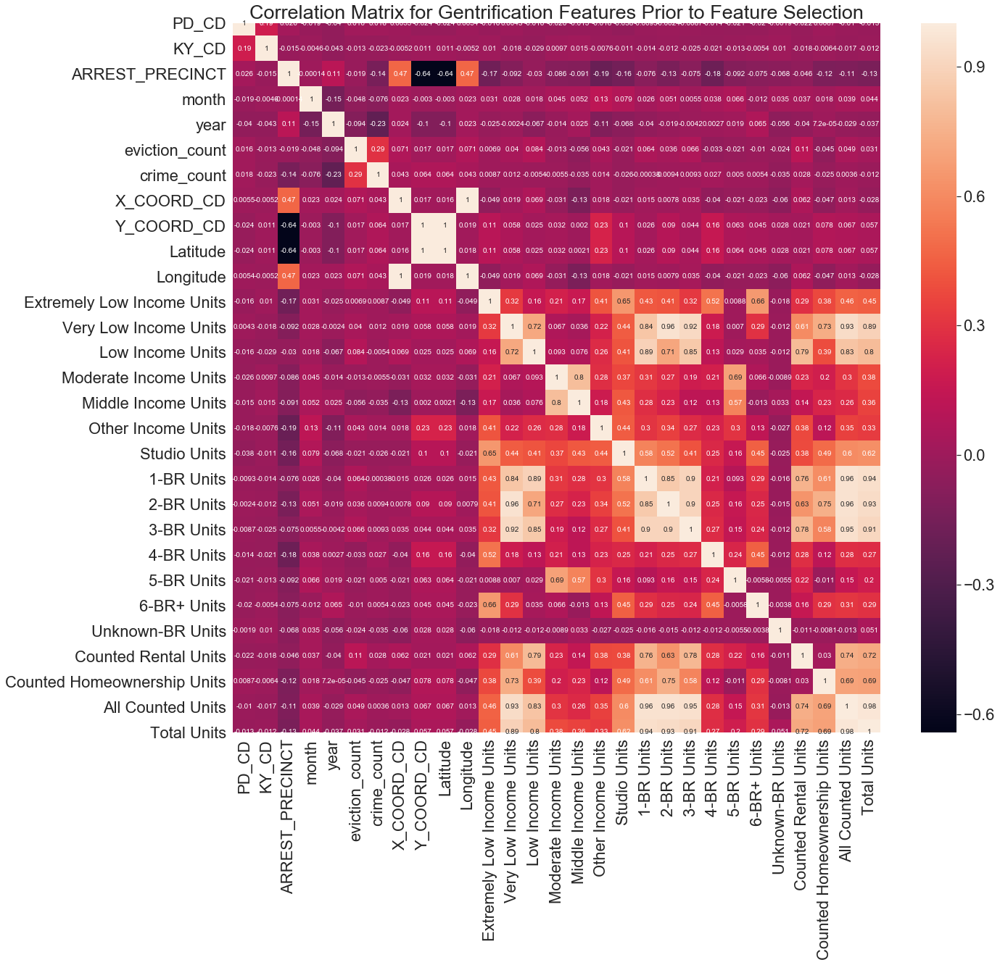

In [136]:
plt.figure(figsize = (20, 18))
sns.heatmap(correlation_df, annot = True)
plt.title("Correlation Matrix for Gentrification Features Prior to Feature Selection", fontdict = {'fontsize': 27})
plt.show()

**The above heatmap shows the correlation between the features we plan to feed into our model BEFORE we do any feature selection techniques and choose our preconceived "best" gentrification features to predict number of crimes per month per year in NYC. We can already see above that the "crime_count" feature has a correlation coefficient of 0.23 with respect to the "eviction_count" feature, which is just one feature of gentrification we are analyzing.**

In [137]:
target_corr = abs(correlation_df["crime_count"])
target_corr

PD_CD                          0.018020
KY_CD                          0.023074
ARREST_PRECINCT                0.140169
month                          0.076187
year                           0.231092
eviction_count                 0.291462
crime_count                    1.000000
X_COORD_CD                     0.042849
Y_COORD_CD                     0.064250
Latitude                       0.064216
Longitude                      0.042628
Extremely Low Income Units     0.008655
Very Low Income Units          0.012175
Low Income Units               0.005364
Moderate Income Units          0.005487
Middle Income Units            0.034809
Other Income Units             0.014352
Studio Units                   0.025842
1-BR Units                     0.000381
2-BR Units                     0.009410
3-BR Units                     0.009278
4-BR Units                     0.026756
5-BR Units                     0.004965
6-BR+ Units                    0.005413
Unknown-BR Units               0.035353


In [138]:
decent_features = list(target_corr[target_corr > 0.05].index)
decent_features.remove("crime_count")
decent_features

['ARREST_PRECINCT',
 'month',
 'year',
 'eviction_count',
 'Y_COORD_CD',
 'Latitude']

## Preliminary Modeling Analysis & Results ##

**As aforementioned in our exploratory data analysis, our project aims to predict the number of crimes per month per year in New York City based on gentrification factors such as eviction rates and income per unit of housing. Since the quantity we are trying to predict is continuous rather than discrete, and since we cannot classify crimes rates as either "low crime"/"high crime" or use any binary classification techniques to predict this quantity, we must use a supervised regression model, rather than classifier. As a result, all of the models that we experimented with in our modeling phase are strictly regression models. We will dive deep into each of our models, explain their underlying algorithmic implementations, and detail how they apply to our final merged dataset and training data later in this notebook.**

**In order to build an accurate regression model, we needed to clean our data. Initially, we dropped all null values from our tables. Although dropping null values runs the risk of losing patterns hidden in the data, we felt confident that no meaningful pattern existed within the null values for the sake of our goal. Our resulting main dataframe of New York arrest reports was stored in a variable called ‘arrests’. We merge the arrests table with two other imported datasets in order to provide more potential gentrification features to choose from during our feature selection process. The first dataset contained data on residential and commercial evictions in New York starting from 2017. We converted the Latitude and Longitude columns into point geometry objects in order to do a spatial join with geojson data that places each eviction property in its corresponding New York neighborhood. After that, we extracted the month and year of each eviction from the date column and converted to values to integers. With the resulting New York evictions table, we grouped the table by year, month, and neighborhood using the value_counts method to get the total number of evictions per (month, year, neighborhood) combination and merged the resulting dataframe to the arrests table on the same columns. The second dataset contained data on construction of housing projects in New York from 2014 to 2021. Similarly, we placed each property in its corresponding neighborhood using a spatial join, extracted the month and year values from the date column, and created a counts table based on the different (month, year, neighborhood) combinations. We merged this with the arrests table.**

**Furthermore, in order to ensure that all features would be treated equally by our feature selection methods, we had to standardize them. Standardizing our variables made it possible for our model to consider all attributes on a common scale, allowing it to differentiate between features based solely on their influence on our predicted variable, arrest counts. This allowed for our model to accurately weight each feature against the influence it holds over the feature we are predicting, which is the number of crimes in NYC per month per year (stored in the "crime_count" column). Next, before training our data on different potential models, it was important to discern the most influential features. To do so, we used a correlation matrix and used a cutoff of 0.05 to weed out the least important features. However, later on we show that this feature selection method was inherently not effective because the cutoff correlation threshold of 0.05 is in fact small and does not show much correlation between the "crime_count" feature and the rest of the features within our combined dataset; yet, we did notice that the feature that was most correlated to "crime_count" was "eviction_count" which further exemplifies that gentrification factors are in fact correlated with crime, except all the features that had a correlation of 0.05 or higher with respect to "crime_count" actually ruined all our model's performances. We show that keeping the entire training dataset (namely, the "X_train" variable) is more effective when modeling and predicting the number of crimes as opposed to feature selection techniques such as correlation thresholds or recursive feature elimination because all of the features in our training dataset are quantitative and more training data allows a few of our models to perform well due to their underlying implementation and algorithm.**

In [139]:
def rmse(pred, actual):
    return np.sqrt(np.mean((pred - actual) ** 2))

## Applying Ordinary Least Squares (OLS) Regression ##

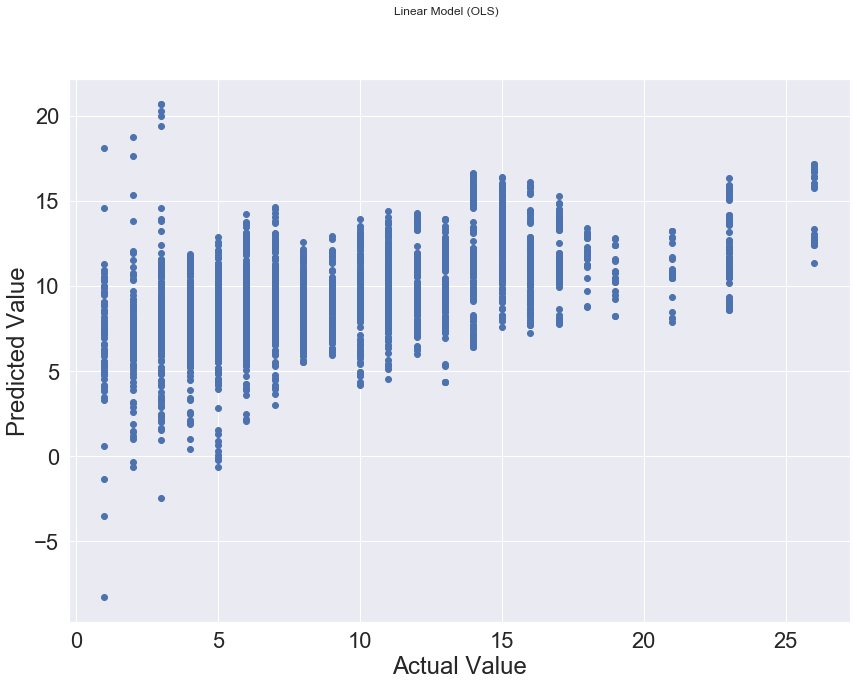

Linear Regression Model RMSE: 4.546070357140592
Linear Regression Model Validation RMSE: 4.554869945814274 

Linear Regression Model Training Accuracy: 0.27875163543297976
Linear Regression Model Validation Accuracy: 0.2896871521177288


In [140]:
lin_model = LinearRegression()
lin_model_fit = lin_model.fit(X_train, y_train)
lin_model_pred = lin_model_fit.predict(X_train)

plt.figure(figsize = (14, 10))
plt.scatter(y_train, lin_model_pred)
plt.xlabel("Actual Value")
plt.ylabel("Predicted Value")
print("Linear Regression Coefficients:", lin_model_fit.coef_)
plt.suptitle("Linear Model (OLS)")
plt.show()

print("Linear Regression Model RMSE:", rmse(lin_model_pred, y_train))
print("Linear Regression Model Validation RMSE:", rmse(lin_model_fit.predict(X_validate), y_validate), "\n")

lin_train_acc = lin_model_fit.score(X_train, y_train)
lin_val_acc = lin_model_fit.score(X_validate, y_validate)
print("Linear Regression Model Training Accuracy:", lin_train_acc)
print("Linear Regression Model Validation Accuracy:", lin_val_acc)

**Ordinary Least Squares regression estimates relationships between independent variables and dependent variables. In order to do this, the model reduces the sums of squares in the difference between observed and predicted values of the dependent variables, generating singular one dimensional lines of best fit. Linear regression is an incredibly efficient regression method, as it is easy to train and easy to adjust when encountering issues due to overfitting. However, Linear Regression is limited by myriad obstacles, inluding its assumption of a linear relationship between independent and dependent variable. This is problematic as data based in real life, such as our gentrification data, is much more complex. As we can see above, our OLS model's training and validation accuracies are pretty low, implying that the many features that we've inputted into the model are not linearly dependent on one another (such as the "Latitude" and "Very Low Income Units" features, for example) which therefore negatively impacts the model's performance**

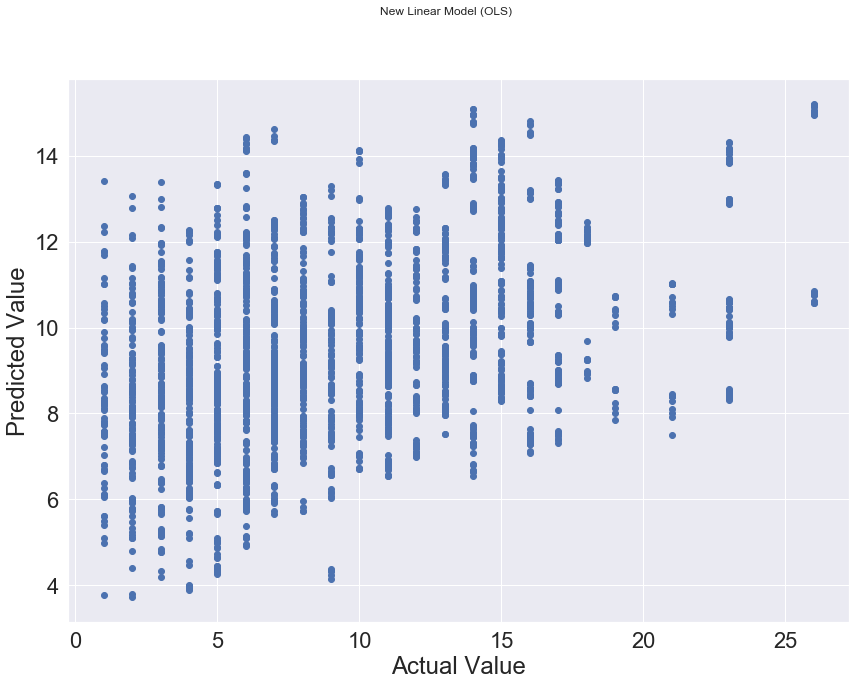

New Linear Regression Model RMSE: 4.902476998106987
New Linear Regression Model Validation RMSE: 4.850114075747717 

New Linear Regression Model Training Accuracy: 0.16122850054750648
New Linear Regression Model Validation Accuracy: 0.19461856458243676


In [141]:
new_lin_model = LinearRegression()
new_lin_model_fit = new_lin_model.fit(X_train[decent_features], y_train)
new_lin_model_pred = new_lin_model_fit.predict(X_train[decent_features])

plt.figure(figsize = (14, 10))
plt.scatter(y_train, new_lin_model_pred)
plt.xlabel("Actual Value")
plt.ylabel("Predicted Value")
print("New Linear Regression Model Coefficients:", new_lin_model_fit.coef_)
plt.suptitle("Linear Model (OLS) with Feature Selection")
plt.show()

print("New Linear Regression Model RMSE:", rmse(new_lin_model_pred, y_train))
print("New Linear Regression Model Validation RMSE:", rmse(new_lin_model_fit.predict(X_validate[decent_features]), 
                                                           y_validate), "\n")

lin_train_features_acc = new_lin_model_fit.score(X_train[decent_features], y_train)
lin_val_features_acc = new_lin_model_fit.score(X_validate[decent_features], y_validate)
print("New Linear Regression Model Training Accuracy:", lin_train_features_acc)
print("New Linear Regression Model Validation Accuracy:", lin_val_features_acc)

**As we can see above, we tried to improve our OLS model's training and validation accuracies by inputting the "decent" features we found during the feature selection process. Since these features are not entirely correlated with one another (except for a select few) and since there are only a few features that are highly correlated with one another, this ruins the model's performance even more. We will in fact show that due to the nature of our final merged "arrests" dataframe none of our feature selection techniques or regression models that have our "decent" features inputted into them perform better than the original regression models. In other words, the features that we feed into the regression models makes them perform worse instead of better because only a select few of them are highly correlated with one another. In this specific case, OLS performs best if the features are linearly dependent which is not the case.**

**Lets try a different feature selection method (namely, recursive feature elimination) to see if this will help improve the features we input into our models:**

In [142]:
# Using one of the feature selection methods from Lab 14
recursive_feature_elimination = RFE(lin_model, n_features_to_select = 7)
recursive_feature_elimination.fit(X_train, y_train)

/Applications/anaconda3/lib/python3.7/site-packages/sklearn/feature_selection/rfe.py:167: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  support_ = np.ones(n_features, dtype=np.bool)
/Applications/anaconda3/lib/python3.7/site-packages/sklearn/feature_selection/rfe.py:168: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for mor

RFE(estimator=LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
                               normalize=False),
    n_features_to_select=7, step=1, verbose=0)

In [143]:
print(recursive_feature_elimination.support_)

[False False False False False  True  True  True  True  True False False
 False False False False False False False False False False False False
 False False  True  True]


**"The feature ranking, such that ranking_[i] corresponds to the ranking position of the i-th feature. Selected (i.e., estimated best) features are assigned rank 1" (Marshall, Lab 14).**

In [144]:
print(recursive_feature_elimination.ranking_)

[21 20  6 12  2  1  1  1  1  1 10  9  4 11 16 19 22  5 13  3 17 14 18 15
  8  7  1  1]


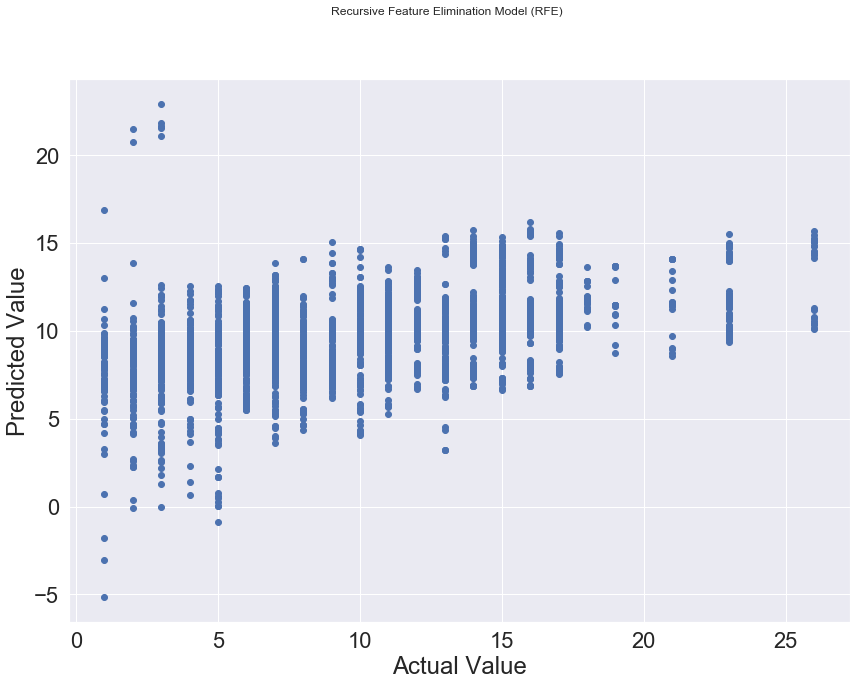

RFE Model RMSE: 4.73034616304956
RFE Model Validation RMSE: 4.750251822828176 

RFE Model Training Accuracy: 0.2190946786086877
RFE Model Validation Accuracy: 0.22744221306488077


In [145]:
rfe_pred = recursive_feature_elimination.predict(X_train)

plt.figure(figsize = (14, 10))
plt.scatter(y_train, rfe_pred)
plt.xlabel("Actual Value")
plt.ylabel("Predicted Value")
plt.suptitle("Recursive Feature Elimination Model (RFE)")
plt.show()

print("RFE Model RMSE:", rmse(rfe_pred, y_train))
print("RFE Model Validation RMSE:", rmse(recursive_feature_elimination.predict(X_validate), y_validate), "\n")

lin_train_recfeatures_acc = recursive_feature_elimination.score(X_train, y_train)
lin_val_recfeatures_acc = recursive_feature_elimination.score(X_validate, y_validate)
print("RFE Model Training Accuracy:", lin_train_recfeatures_acc)
print("RFE Model Validation Accuracy:", lin_val_recfeatures_acc)

**As we can see above, the training and validation accuracies of the RFE model is relatively consistent with the original OLS model prior to inputting our "decent" features. We must try other regression models and attempt to improve our model performance, since we already tried improving the model with a new feature selection technique (namely, RFE).**

## Applying Ridge Regression ##

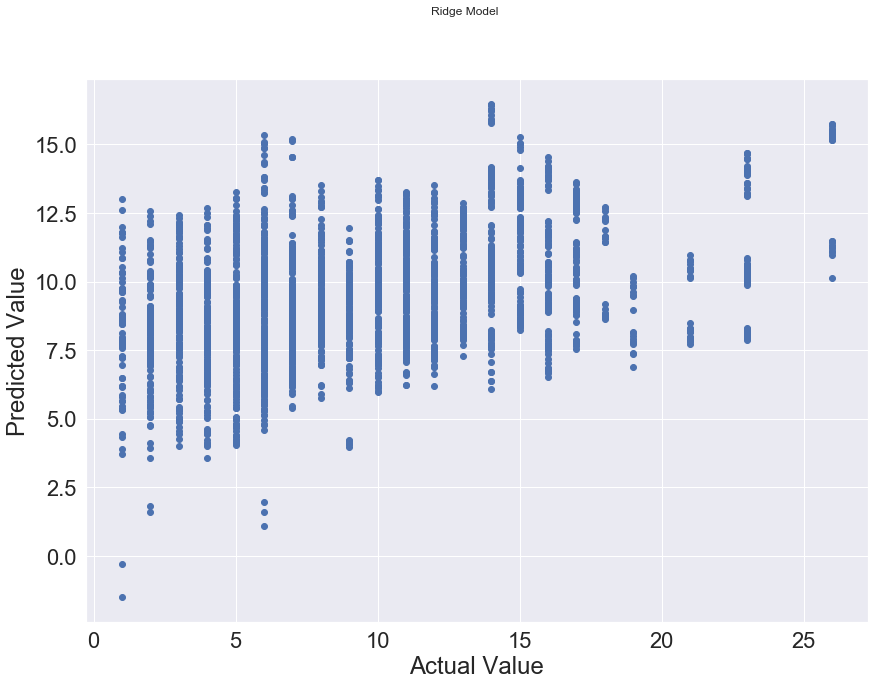

Ridge Regression Model RMSE: 4.848081854993395
Ridge Regression Model Validation RMSE: 4.842161472534894 

Ridge Regression Model Training Accuracy: 0.17973831935798879
Ridge Regression Model Validation Accuracy: 0.19725752438252808


In [146]:
ridge = Ridge()
ridge_model = ridge.fit(X_train, y_train)
ridge_pred = ridge_model.predict(X_train)

plt.figure(figsize = (14, 10))
plt.scatter(y_train, ridge_pred)
plt.xlabel("Actual Value")
plt.ylabel("Predicted Value")
plt.suptitle("Ridge Model")
plt.show()


print("Ridge Regression Model RMSE:", rmse(ridge_pred, y_train))
print("Ridge Regression Model Validation RMSE:", rmse(ridge_model.predict(X_validate), y_validate), "\n")

ridge_train_acc = ridge_model.score(X_train, y_train)
ridge_val_acc = ridge_model.score(X_validate, y_validate)
print("Ridge Regression Model Training Accuracy:", ridge_train_acc)
print("Ridge Regression Model Validation Accuracy:", ridge_val_acc)

**Ridge Regression produces a predictive model by creating a collinear equation weighting features by the influence it holds over our predicted variable. A feature with a heavier weight is seemingly much more influential, while a feature with a lighter weight impacts the predicted variable less. Ridge Regression will help us create an accurate predictive model because it works very well when fed with multiple features. Even though Ridge Regression is a good choice of model, it is important to acknowledge its disadvantages. For instance, a feature may, in code, seem to have no bearing over our predicted variable, yet it could have a larger societal meaning that is not be encoded in the data. This would mean that Ridge Regression assigns a lighter weight to the feature, even though it holds great influence over the predicted variable. Further, in the context of our dataset we already discussed how the columns in "X_train" are not linearly dependent on one another, and since ridge regression's underlying algorithm must satify the collinearity condition, its training and validation accuracies are low as a result.**

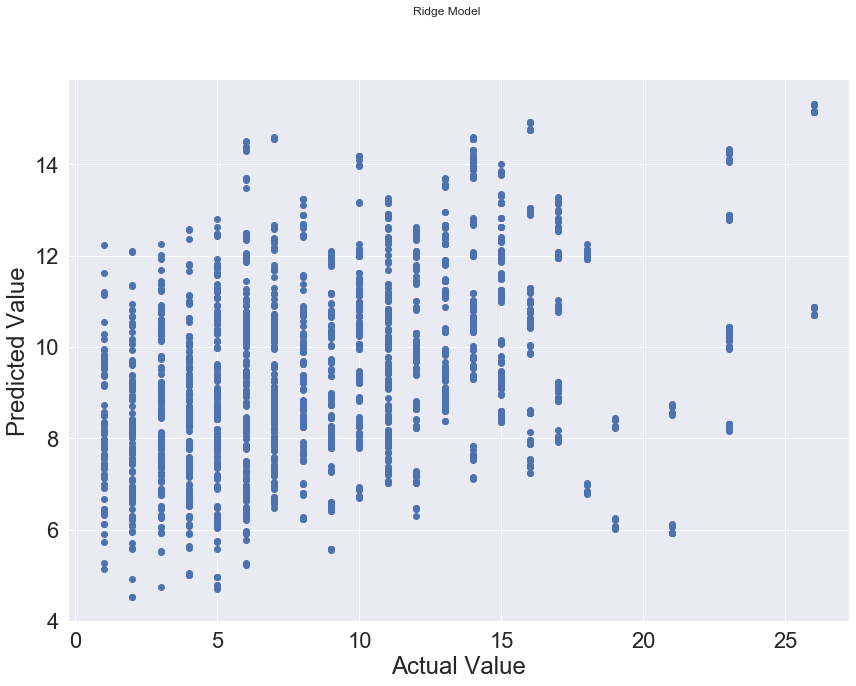

New Ridge RMSE: 4.945897040518002
New Ridge Training Accuracy: 0.14630511656048428


In [147]:
new_ridge = Ridge()
new_ridge_model = new_ridge.fit(X_train[decent_features], y_train)
new_ridge_pred = new_ridge_model.predict(X_train[decent_features])

plt.figure(figsize = (14, 10))
plt.scatter(y_train, new_ridge_pred)
plt.xlabel("Actual Value")
plt.ylabel("Predicted Value")
plt.suptitle("Ridge Model with Feature Selection")
plt.show()

ridge_train_features_acc = new_ridge_model.score(X_train[decent_features], y_train)
ridge_val_features_acc = new_ridge_model.score(X_validate[decent_features], y_validate)
print("New Ridge RMSE:", rmse(new_ridge_pred, y_train))
print("New Ridge Training Accuracy:", ridge_train_features_acc)

**Above, we also tried to improve the ridge model's training and validation accuracies by inputting our "decent" features, but as we've said before these features do not improve any of our models since only a select few of them are actually highly correlated. This factor of dimensionality reduction alongside lack of collinearity condition being met is what makes this particular ridge regression model so bad compared to the original initial ridge regression model (which is also relatively bad performance-wise).**

## Applying Lasso Regression ##

In [148]:
lasso_cross_val_model = LassoCV(cv = 2, max_iter = 1000)
lasso_cross_val_fitted = lasso_cross_val_model.fit(X_train, y_train)

lasso_train_acc = lasso_cross_val_model.score(X_train, y_train)
lasso_val_acc = lasso_cross_val_model.score(X_validate, y_validate)
print("LassoCV RMSE:", rmse(lasso_cross_val_model.predict(X_train), y_train))
print("LassoCV Training Accuracy:", lasso_train_acc)

LassoCV RMSE: 4.86581191664651
LassoCV Training Accuracy: 0.17372774282453318


/Applications/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:442: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  fold_sizes = np.full(n_splits, n_samples // n_splits, dtype=np.int)
/Applications/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_split.py:102: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecate

**Lasso Regression uses a concept called shrinkage to essentially perform feature selection through variable elimination. Shrinkage is the model’s ability to “shrink” all data points based on how similar they are to a central value. Each data point is weighed against the central value, shrinking towards 0 if the value of the data point is distant from the central value. As data points are “shrunk”, features are passively eliminated through their eventual disappearance of associated data. Lasso Regression is useful when the data exhibits high dimensioniality and high correlation. However, in circumstances where neither of those hold, Lasso is not very useful. Therefore, since our training data is not highly correlated with the "crime_count" column, Lasso also performs poorly for our training data.**

## Applying Support Vector Machine Regression (SVR) ##

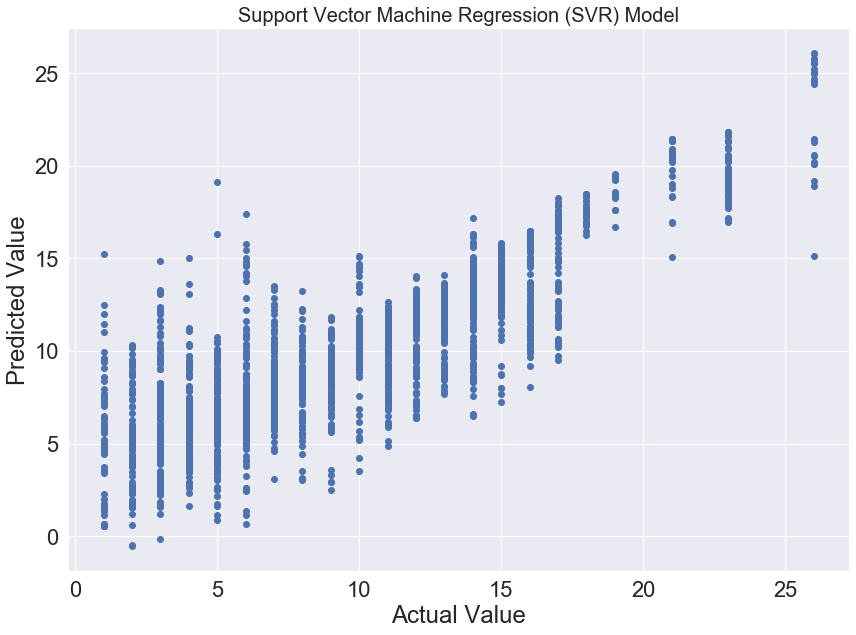

SVM Regression Model RMSE: 2.651046417199025
SVM Regression Model Validation RMSE: 2.8676079172809175 

SVM Regression Model Training Accuracy: 0.7547284364835936
SVM Regression Model Validation Accuracy: 0.7184618520785215
SVM Regression Model Parameters:


{'memory': None,
 'steps': [('standardscaler',
   StandardScaler(copy=True, with_mean=True, with_std=True)),
  ('svr', SVR(C=38.42, cache_size=200, coef0=0.0, degree=3, epsilon=0.45,
       gamma='auto_deprecated', kernel='rbf', max_iter=-1, shrinking=True,
       tol=0.001, verbose=False))],
 'verbose': False,
 'standardscaler': StandardScaler(copy=True, with_mean=True, with_std=True),
 'svr': SVR(C=38.42, cache_size=200, coef0=0.0, degree=3, epsilon=0.45,
     gamma='auto_deprecated', kernel='rbf', max_iter=-1, shrinking=True,
     tol=0.001, verbose=False),
 'standardscaler__copy': True,
 'standardscaler__with_mean': True,
 'standardscaler__with_std': True,
 'svr__C': 38.42,
 'svr__cache_size': 200,
 'svr__coef0': 0.0,
 'svr__degree': 3,
 'svr__epsilon': 0.45,
 'svr__gamma': 'auto_deprecated',
 'svr__kernel': 'rbf',
 'svr__max_iter': -1,
 'svr__shrinking': True,
 'svr__tol': 0.001,
 'svr__verbose': False}

In [149]:
# lets try a support vector machine (SVM) regression model

# https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVR.html 

# https://scikit-learn.org/stable/modules/svm.html 

SVM_model = make_pipeline(StandardScaler(), SVR(C = 38.42, epsilon = 0.45))

# the argument "SVR" implies that the SVM model is in fact a regression model
# SVR stands for "Support Vector Regression"
# the "C" parameter is the squared L2 regularization penalty paramater in the SVR's underlying implementation.
# As the "C" parameter increases, it takes more time to train the data. Decreasing it leads to more regularization. 
# the "epsilon" parameter represents the distance away from the training loss function, based on the value of C.

SVM_model_fitted = SVM_model.fit(X_train, y_train)
SVM_model_pred = SVM_model_fitted.predict(X_train)

plt.figure(figsize = (14, 10))
plt.scatter(y_train, SVM_model_pred)
plt.xlabel("Actual Value")
plt.ylabel("Predicted Value")
plt.title("Support Vector Machine Regression (SVR) Model",  fontdict = {'fontsize': 20})
plt.show()

print("SVM Regression Model RMSE:", rmse(SVM_model_pred, y_train))
print("SVM Regression Model Validation RMSE:", rmse(SVM_model_fitted.predict(X_validate), y_validate), "\n")

svm_train_acc =  SVM_model_fitted.score(X_train, y_train)
svm_val_acc = SVM_model_fitted.score(X_validate, y_validate)
print("SVM Regression Model Training Accuracy:", svm_train_acc)
print("SVM Regression Model Validation Accuracy:", svm_val_acc)
print("SVM Regression Model Parameters:")

SVM_model.get_params()

**In Support Vector Machine Regression, the goal is to find a hyperplane which accurately separates a majority of the data points, creating “classes” based on which side of the hyperplane a data point falls. A hyperplane is a plane which takes on one less dimension than the field it exists in. In order to better understand SVM, consider a line of best fit. In a 2D field, a line of best fit averages the y values to best find a line which either intersects or separates all or most of the data points. If the data is so separated that no line can fit through all points, then the line of best fit becomes a dividing line between data points, categorizing data points based on existing similarities. Now consider the 3D field: a hyperplane is a line of best fit, but in two dimensions, rather than one. SVM is incredibly useful for generalization and is robust to outliers. However, it is very sensitive to noise, as it is difficult to separate the data into classes, making it unideal for certain datasets.**

**We chose SVM as one of our models to experiment because it gave one of the lowest rmse, at 2.635, of all our tested models. Root Mean Square Error essentially calculates how far each data point is from the line of best fit. Therefore, a lower rmse shows smaller residuals which means a more accurate model. Furthermore, SVM’s model score showcases the model’s higher training accuracy when compared to that of the other models. SVM’s score was approximately 76%, while other model scores were as low as 20%. The reason why this model performs better than any of the previous ones and as a higher training and validation accuracy is because the condition that the training data (aka X_train) must be linearly dependent or have a collinearity condition does not exist. As we've already discussed, most of our features are not dependent on each other OR highly correlated with each other because we are trying to predict crime based on gentrification factors such as eviction and income housing levels. The model above performs great for predicting crime based on these factors because the condition of dependence does not hold true and the "C" parameter is the squared L2 regularization penalty paramater in the SVR's underlying implementation, which helps train our data further. As the "C" parameter increases, it takes more time to train the data. Decreasing it leads to more regularization. Additionally, the "epsilon" parameter represents the distance away from the training loss function, based on the value of C and we set it to 0.45 to account for errors and biases.**

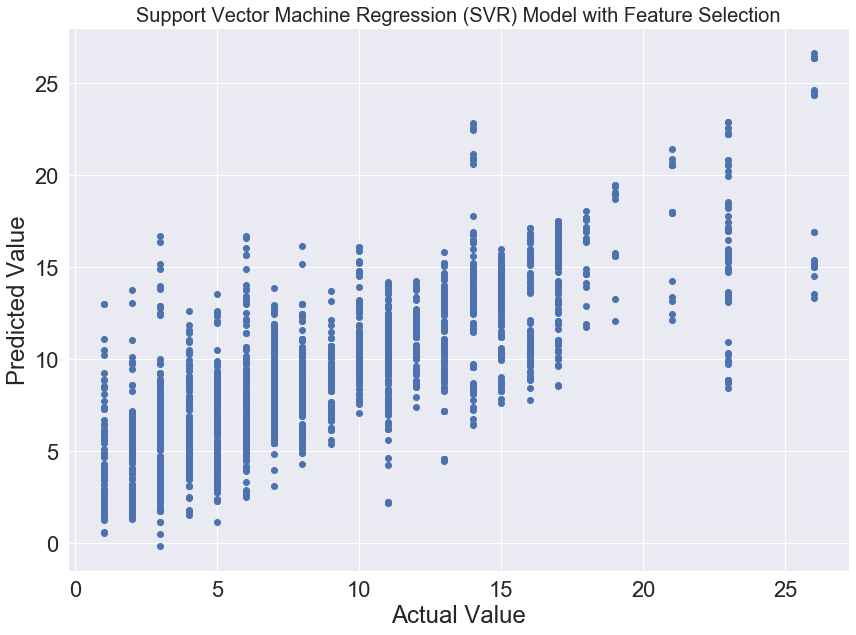

SVM Regression Model RMSE: 3.23698129507746
SVM Regression Model Validation RMSE: 3.486099620042021 

SVM Regression Model Training Accuracy: 0.6343269825362463
SVM Regression Model Validation Accuracy: 0.5839195650334861
SVM Regression Model Parameters:


{'memory': None,
 'steps': [('standardscaler',
   StandardScaler(copy=True, with_mean=True, with_std=True)),
  ('svr', SVR(C=38.42, cache_size=200, coef0=0.0, degree=3, epsilon=0.45,
       gamma='auto_deprecated', kernel='rbf', max_iter=-1, shrinking=True,
       tol=0.001, verbose=False))],
 'verbose': False,
 'standardscaler': StandardScaler(copy=True, with_mean=True, with_std=True),
 'svr': SVR(C=38.42, cache_size=200, coef0=0.0, degree=3, epsilon=0.45,
     gamma='auto_deprecated', kernel='rbf', max_iter=-1, shrinking=True,
     tol=0.001, verbose=False),
 'standardscaler__copy': True,
 'standardscaler__with_mean': True,
 'standardscaler__with_std': True,
 'svr__C': 38.42,
 'svr__cache_size': 200,
 'svr__coef0': 0.0,
 'svr__degree': 3,
 'svr__epsilon': 0.45,
 'svr__gamma': 'auto_deprecated',
 'svr__kernel': 'rbf',
 'svr__max_iter': -1,
 'svr__shrinking': True,
 'svr__tol': 0.001,
 'svr__verbose': False}

In [150]:
SVM_new_model = make_pipeline(StandardScaler(), SVR(C = 38.42, epsilon = 0.45))

SVM_new_model_fitted = SVM_model.fit(X_train[decent_features], y_train)
SVM_new_model_pred = SVM_model_fitted.predict(X_train[decent_features])

plt.figure(figsize = (14, 10))
plt.scatter(y_train, SVM_new_model_pred)
plt.xlabel("Actual Value")
plt.ylabel("Predicted Value")
plt.title("Support Vector Machine Regression (SVR) Model with Feature Selection",  fontdict = {'fontsize': 20})
plt.show()

print("SVM Regression Model RMSE:", rmse(SVM_new_model_pred, y_train))
print("SVM Regression Model Validation RMSE:", rmse(SVM_new_model_fitted.predict(X_validate[decent_features]), 
                                                    y_validate), "\n")

svm_train_features_acc = SVM_new_model_fitted.score(X_train[decent_features], y_train)
svm_val_features_acc = SVM_new_model_fitted.score(X_validate[decent_features], y_validate)
print("SVM Regression Model Training Accuracy:", svm_train_features_acc)
print("SVM Regression Model Validation Accuracy:", svm_val_features_acc)
print("SVM Regression Model Parameters:")

# print("New SVM Model RMSE:", rmse(SVM_model_pred, y_train))
# print("New SVM Model Training Accuracy:", SVM_new_model_fitted.score(X_train[decent_features], y_train))

# print("New SVM Model Parameters:")
SVM_new_model.get_params()

**The above "New" SVM Regression model shows that the model performs worse with our selected features that we found were most correlated to the "crime_count" variable in the merged new york crimes dataset. In other words, dimensionality reduction does not help make our SVM regression model perform better because the features that we concluded were "decent" are inherently not that correlated with one another, therefore using the entire training dataset, namely the "X_train" variable, allows us to achieve the highest training and validation accuracies with our SVM regresison model.**

## Applying Decision Tree Regression ##

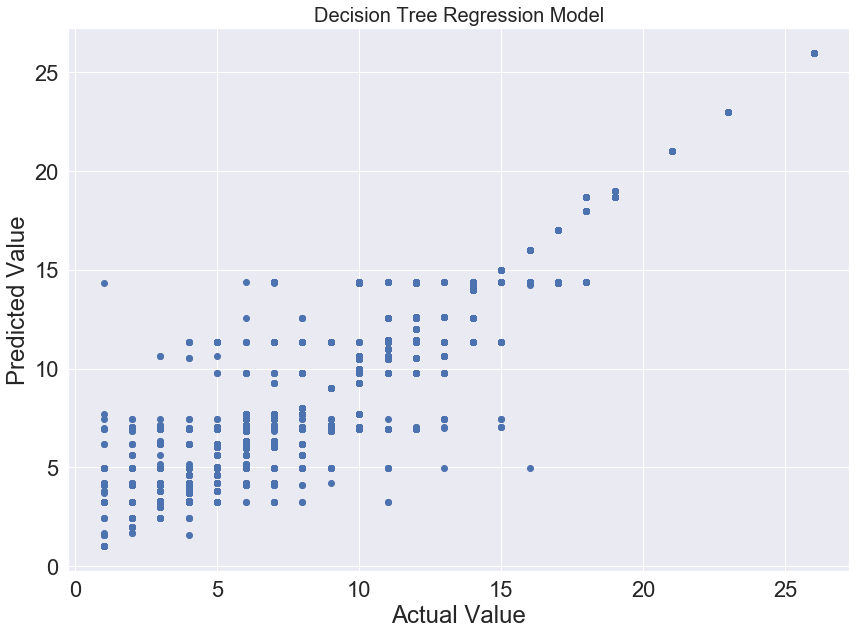

Decision Tree Regression RMSE: 2.0867798752357754
Decision Tree Regression Validation RMSE: 2.5422255865255363 

Decision Tree Regression Training Accuracy: 0.8480272174208809
Confirming our Decision Tree Regression Training Accuracy: 0.8480272174208809
Decision Tree Regression Validation Accuracy: 0.7787282968938867


In [151]:
decision_tree = DecisionTreeRegressor(criterion = "mse", max_depth = 7) # mse = mean squared error
decision_tree_model = decision_tree.fit(X_train, y_train)
decision_tree_pred = decision_tree_model.predict(X_train)

plt.figure(figsize = (14, 10))
plt.scatter(y_train, decision_tree_pred)
plt.xlabel("Actual Value")
plt.ylabel("Predicted Value")
plt.title("Decision Tree Regression Model", fontdict = {'fontsize': 20})
plt.show()

print("Decision Tree Regression RMSE:", rmse(decision_tree_pred, y_train))
print("Decision Tree Regression Validation RMSE:", rmse(decision_tree_model.predict(X_validate), y_validate), "\n")

dt_train_acc = decision_tree_model.score(X_train, y_train)
dt_val_acc = decision_tree_model.score(X_validate, y_validate)
print("Decision Tree Regression Training Accuracy:", dt_train_acc)
print("Confirming our Decision Tree Regression Training Accuracy:", r2_score(y_train, decision_tree_pred))
print("Decision Tree Regression Validation Accuracy:", dt_val_acc)

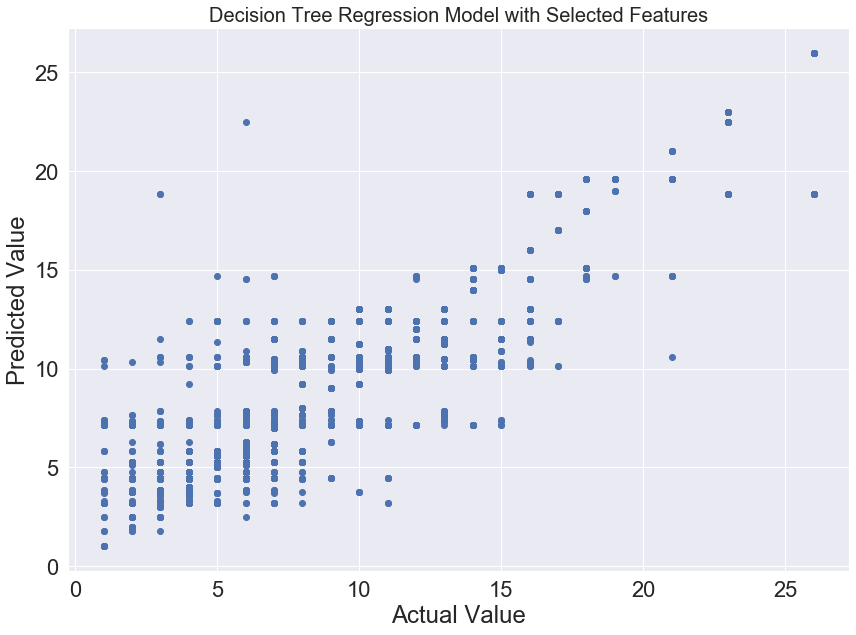

New Decision Tree RMSE: 2.5284407367543174
New Decision Tree Training Accuracy: 0.7768904843247884


In [152]:
# decision tree with selected features 
new_decision_tree = DecisionTreeRegressor(max_depth = 7)
new_decision_tree_model = new_decision_tree.fit(X_train[decent_features], y_train)
new_decision_tree_pred = new_decision_tree_model.predict(X_train[decent_features])

plt.figure(figsize = (14, 10))
plt.scatter(y_train, new_decision_tree_pred)
plt.xlabel("Actual Value")
plt.ylabel("Predicted Value")
plt.title("Decision Tree Regression Model with Selected Features", fontdict = {'fontsize': 20})
plt.show()

dt_train_features_acc = new_decision_tree_model.score(X_train[decent_features], y_train)
dt_val_features_acc = new_decision_tree_model.score(X_validate[decent_features], y_validate)
print("New Decision Tree RMSE:", rmse(new_decision_tree_pred, y_train))
print("New Decision Tree Training Accuracy:", dt_train_features_acc)

**Similar to other common data structures such as binary search trees and red-black trees, in the context of machine learning, decision trees are non-linear and hierarchical tree structures that allow a training dataset to be broken down and further partitioned into chunks of data such that an outcome can be accurately predicted using decision rules and decision nodes. More specifically, decision trees allow their child nodes and "decision" nodes to recursively partition a subset of the training data that is initially fed into the model at the highest point of the tree known as the decision root. We can think of the underlying algorithm that decision trees rely on as being analogous to first initially asking a question to a user (aka starting at the decision root) and then asking the user an N number of subsequent questions (aka at the decision leaf level) until the final outcome is reached. As shown above, this model gives us the highest training accuracy and performs the best without any feature selection or further manipulating our training dataset (namely, X_train). We've previously discussed how our other regression models depend on the conditions such as linear dependence and collinearity within our training dataset's features; however, just like the support vector machine regression model, the decision tree regression model does not rely on the existence of these conditions and therefore our training datset works well with this model (unlike OLS, Ridge, and Lasso). Additionally, since our overarching problem is trying to predict the number of crimes in NYC per month per year based on gentrification factors and since this quantity is continuous and not discrete, we set the "criterion" parameter in the decision tree regression model to "mse", which stands for mean squared error, in order to properly assign the impurity metric for the decision leaf nodes to recursively process. In other words, each time the training data is recursively partitioned, then each decision leaf node will perform a weighted mean squared error of the data as a means of an "impurity check" to ensure that the predicted outcome does not have any biases or errors. Once again, this algorithm works well with our training dataset because it does not care about linear dependence of the features, collinearity between the features, correlation between the features, or how large the training dataset actually is. Lastly, the specific graph above shows that our decision tree regression model with feature selection performed worse compared to the decision tree regression model without any feature selection, further implying that larger training data is what allows for this regression model to improve its training accuracy since the recursive partition process is longer at each leaf node.**

In [153]:
# making predictions for the test set using our best model (aka Decision Tree Regression without feature selection)
final_pred = decision_tree_model.predict(X_test)

# calculating the rmse and test set accuracy for the Final prediction, to compare with our training accuracy.
print('Test Set RMSE: ', rmse(final_pred, y_test))
print("Test Set Accuracy:", decision_tree_model.score(X_test, y_test))

Test Set RMSE:  2.5225594181538256
Test Set Accuracy: 0.7705534112297735


**As we can see above, we are testing our best model, namely the decision tree regression model, with our test set to confirm that our training accuracy in fact does match and is relatively consistent with the test set accuracy. This is the whole point of the test set existing in the first place, and we've confirmed that through trial and error and after experimenting with various regression models and their parameters in order to accurately predict the number of crimes in NYC per month per year based on gentrification factors such as eviction rates and housing income units, the decision tree regression model performs the best and this is evident as the test set accuracy closely matches its training accuracy and is also evident as this model has the highest training accuracy with a relatively consistent validation accuracy across all the models we've experimented our training data on, including the support vector machine regression model.**

## Final Modeling Analysis & Results ##

**The following is a visualization of how each of our regression models performed in terms of accuracy on both the training and validation sets:**

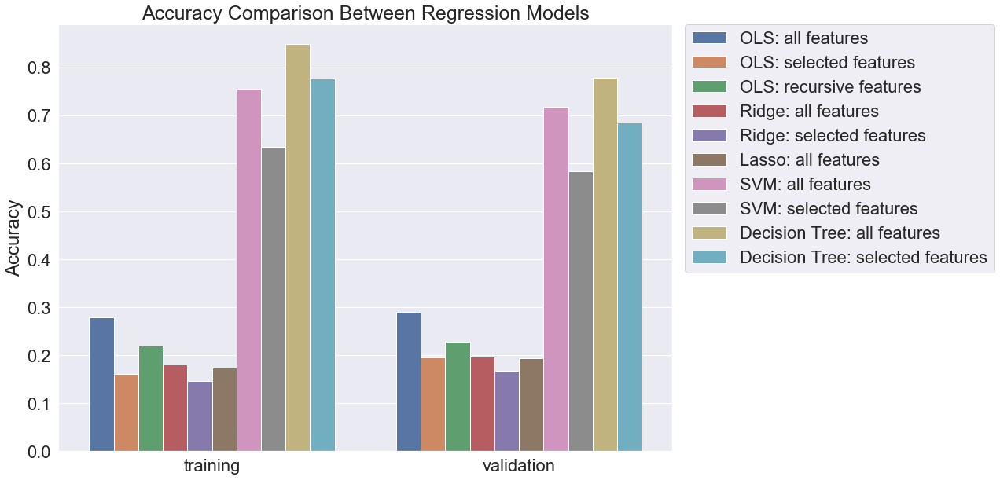

In [154]:
data = {
    "OLS: all features": [lin_train_acc, lin_val_acc],
    "OLS: selected features": [lin_train_features_acc, lin_val_features_acc],
    "OLS: recursive features": [lin_train_recfeatures_acc, lin_val_recfeatures_acc],
    "Ridge: all features": [ridge_train_acc, ridge_val_acc],
    "Ridge: selected features": [ridge_train_features_acc, ridge_val_features_acc],
    "Lasso: all features": [lasso_train_acc, lasso_val_acc],
    "SVM: all features": [svm_train_acc, svm_val_acc],
    "SVM: selected features": [svm_train_features_acc, svm_val_features_acc],
    "Decision Tree: all features": [dt_train_acc, dt_val_acc],
    "Decision Tree: selected features": [dt_train_features_acc, dt_val_features_acc]    
}

regression_names = list(data.keys())
regression_names = [x for x in regression_names for _ in (0,1)]

acc_values = list(data.values())
acc_values = [x[a] for x in acc_values for a in (0,1)]

set_type = ["training", "validation"] * len(data)

accuracies_tbl = {"regression type": regression_names, "accuracies": acc_values, "set": set_type}

plt.figure(figsize = (14, 10))
plt.title("Accuracy Comparison Between Regression Models", fontdict = {'fontsize': 25})
plt.ylabel("Accuracy")
sns.set(font_scale = 2)
sns.barplot(data=accuracies_tbl, x="set", y="accuracies", hue="regression type")
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0);

**After experimenting with Ordinary Least Squares, Ridge Regression, Lasso Regression, Support Vector Machine Regression, and Decision Tree Regression, we conclude that Decision Tree Regression most accurately predicts the number of crimes in NYC per month per year given a set of gentrification features.**

**As previously stated, OLS works perfectly for datasets with a low number of rows and columns that are highly correlated with one other. However, many features describe the relationship between the neighborhood and its crime rate, so OLS is unable to account for the complex relationships hidden in our data. This means that the model is trying to capture our data in an inaccurate number of dimensions, simplifying the relationship between neighborhood and crime and therefore producing more errors.**

**Furthermore, Ridge Regression does not serve our data well because, when looking at the features selected by our target cutoff, it leaves out the socially important features. For instance, the number of very low income units vs moderate income units showcases the affluence of the area, but these features were not selected for by our Ridge model. Our hypothesis is based on the premise that more moderate income units are emerging in a neighborhood with a lower crime rate, meaning that the number of these units should be affecting the predicted rate. The Ridge model most likely places less value on these important features as it is weighing them against more seemingly influential features like Arrest Precinct. Similar to our Ridge model, the Lasso model is removing features of seemingly low importance, such as the number of various income units. Therefore, societally important factors are being ignored because the algorithm can not understand their influence. This means that the model is actively ignoring important features.**

**Finally, the SVM regression model is rooted in the idea that a dataset is highly dimensional. Rather than creating a line of best fit, SVR is able to adapt to the number of dimensions a dataset exists in, more accurately adjusting to the high dimensionality of our data. This means that SVR more accurately captures the complex relationships between our features, helping it predict crime rates almost as accurately as our Decision Tree model.**

**When paired with the above graphs and choropleth maps, our model proves the relationship between gentrification and crime rates. As seen in the above graph, our SVR and Decision Tree models exhibit a high training accuracy and relatively consistent validation accuracy. This shows that gentrification is in fact a good indicator of crime rates in NYC. Because our features are not highly correlated, Decision Tree Regression proved to be the best regression model for predicting crime rates from our training data. Generally speaking, as more individuals are evicted from an area, the overall crime rate drops. This is most likely due to a phenomenon known as the “racial tipping point”: the concept which describes how an area's non-white population will eventually reach a certain threshold such that white “flight” exists (Schelling 1971). This means that as a certain geography becomes more diverse, the group of white residents will eventually flock to a newer, "whiter" area. The point at which white flight has a predominantly large effect on the population of the area is what is known as the tipping point. Once the majority group exists, the neighborhood gets caught in a “poverty loop” of poor education systems and low funding for community development. In theory, this poverty trap would then lead to an increase in crime. Thus as a community becomes more racially diverse, the government pays less attention to that area, in turn creating a poverty loop (Schelling 1971). Similarly, as more individuals are evicted from an area, more room for commercial businesses and upscale housing becomes available, turning an area into a gentrified neighborhood. As a byproduct of this transformation, the amount of crime decreases.**